In [ ]:
# SIFT ONLY works on specific OpenCV non-commercial version
# Install opencv-contrib-python 4.4.0.44 to run SIFT
# Ref: https://stackoverflow.com/questions/64474059/how-to-use-sift-and-surf-algorithm-in-google-colab-with-opencv4

!pip install opencv-contrib-python==4.4.0.44

     |████████████████████████████████| 55.7 MB 88 kB/s 
  Attempting uninstall: opencv-contrib-python
    Found existing installation: opencv-contrib-python 4.1.2.30
    Uninstalling opencv-contrib-python-4.1.2.30:
      Successfully uninstalled opencv-contrib-python-4.1.2.30


In [ ]:
import cv2
from matplotlib import pyplot as plt

In [ ]:
# This Code was developted on Google Colab. Please REMOVE this cell if you are running it locally.
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# This Code was developted on Google Colab. Please REMOVE this cell if you are running it locally.
# Mount Selected Folder in Google Drive
import os
os.chdir("/content/drive/My Drive/COMP90086_CV_Project") 

In [ ]:
# Check OpenCV version
print (cv2 .__version__ )

4.4.0


In [ ]:
# Apply SIFT to input images and use RANSAC to select valid points
# Outputs the SIFT similarity score 
# Ref: https://stackoverflow.com/questions/16002709/how-to-apply-ransac-on-surf-sift-and-orb-matching-results

def sift_ransac_score(pic1, pic2):
    sift = cv2.xfeatures2d.SIFT_create()
    
    pic1_gs = cv2.imread(pic1, cv2.IMREAD_GRAYSCALE)
    pic2_gs = cv2.imread(pic2, cv2.IMREAD_GRAYSCALE)
    keypoints1, destination1 = sift.detectAndCompute(pic1_gs, None)
    keypoints2, destination2 = sift.detectAndCompute(pic2_gs, None)
    
    # If can not find enough points , returns 0
    if keypoints2 == [] or len(keypoints2)<5:
        return 0
    
    FLANN_INDEX_KDTREE = 0
    flannMatch = cv2.FlannBasedMatcher(dict(algorithm=FLANN_INDEX_KDTREE, trees=5), dict(checks=50))

    matches = flannMatch.knnMatch(destination1, destination2, k=2)
    
    matches_mask = []
    for i in range(len(matches)):
        matches_mask.append([0,0])
     
    match_point_num = 0
    for i, (x, y) in enumerate(matches):
        if x.distance < 0.7*y.distance:
            matches_mask[i] = [1, 0]
            match_point_num += 1

    drawing_parameters = dict(matchColor=(0, 255, 0),
                     singlePointColor=(255, 0, 0),
                     matchesMask=matches_mask,
                     flags=0)

    match_img = cv2.drawMatchesKnn(pic1_gs, keypoints1, pic2_gs, keypoints2, matches, None, **drawing_parameters)

    # If can not find enough points , returns 0   
    if len(matches_mask) == 0:
        return 0
    
    if match_point_num>0.6*len(matches_mask):
        plt.subplot(1,1,1)
        plt.imshow(match_img) 
        plt.title("Similarity %.2f %%" % (match_point_num/len(matches_mask)*100))
        plt.axis('off')
        plt.show()
    
    return (match_point_num/len(matches_mask))

In [ ]:
# For pHash Only, Use the Hash methods
# Read, resize, DCT to find smallest hash distance
# Hash is much faster than SIFT
# Ref: https://python.hotexamples.com/examples/imagehash/-/phash/python-phash-function-examples.html
# Ref: https://programtalk.com/python-examples/imagehash.phash/

import numpy as np

def pHash(img_dir,leng=32,wid=32):
    img_gs = cv2.imread(img_dir, cv2.IMREAD_GRAYSCALE)
    # Resize to 32 x 32 default
    img_rz = cv2.resize(img_gs, (leng, wid))
    # Apply DCT
    dct = cv2.dct(np.float32(img_rz))
    dct_roi = dct[0:8, 0:8]            
    average = np.mean(dct_roi)
    phash_01 = (dct_roi>average)+0
    phash_list = phash_01.reshape(1,-1)[0].tolist()
    phash_str=""
    for x in phash_list:
      phash_str = phash_str + str(x)
    return phash_str

In [ ]:
# For pHash Only
# Calculate the Hamming Distance
# Ref: https://python.hotexamples.com/examples/imagehash/-/phash/python-phash-function-examples.html
# Ref: https://programtalk.com/python-examples/imagehash.phash/

def Hamming_distance(img1_hash,img2_hash):
    diff_bit_num = 0
    for each_bit in range(len(img1_hash)):
        if img1_hash[each_bit] != img2_hash[each_bit]:
            diff_bit_num += 1
    return (1 - diff_bit_num * 1.0 / 64) 

In [ ]:
# For pHash Only
# Python program to find N largest
# element from given DICT of numbers
# Ref: https://www.geeksforgeeks.org/python-program-to-find-n-largest-elements-from-a-list/
  
# Function returns N largest elements
def Nmax_dict_elements(dict1, N):
    final_dict = dict()
    if N >= len(dict1):
      return dict1
  
    for i in range(0, N): 
        max1 = 0
        max_key = ""
          
        for key in dict1:     
            if dict1[key] > max1:
                max1 = dict1[key];
                max_key = key;
                  
        del dict1[max_key];
        final_dict[max_key]=max1
          
    return(final_dict)

In [ ]:
# Prepare for ResNet and VGG
# Ref: COMP90086 Workshop 6, Unimelb

from datetime import datetime
from packaging import version

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

import numpy as np
import matplotlib.pyplot as plt

from scipy import ndimage 

print("TensorFlow version: ", tf.__version__)

TensorFlow version:  2.6.0


In [ ]:
# Prepare for ResNet and VGG
# Ref: COMP90086 Workshop 6, Unimelb

from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions

In [ ]:
# Prepare for ResNet and VGG
# Ref: COMP90086 Workshop 6, Unimelb

import os
import re
import csv
from tqdm import tqdm

train_folder_dir = './COMP90086_2021_Project_train/train/'
train_dir_list = os.listdir(train_folder_dir)
test_folder_dir = './COMP90086_2021_Project_test/test/'
test_dir_list = os.listdir(test_folder_dir)

In [ ]:
cv2.imread(train_folder_dir+train_dir_list[0], cv2.IMREAD_GRAYSCALE).shape

(490, 680)

In [ ]:
# Prepare for ResNet and VGG
# Ref: COMP90086 Workshop 6, Unimelb

from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.models import Model
import numpy as np

In [ ]:
# Prepare for ResNet
# Ref: COMP90086 Workshop 6, Unimelb

resnet_fea_model = ResNet50(weights='imagenet')
for layer_index in range(len(resnet_fea_model.layers)):
  print(resnet_fea_model.get_layer(index = layer_index).name)

input_1
conv1_pad
conv1_conv
conv1_bn
conv1_relu
pool1_pad
pool1_pool
conv2_block1_1_conv
conv2_block1_1_bn
conv2_block1_1_relu
conv2_block1_2_conv
conv2_block1_2_bn
conv2_block1_2_relu
conv2_block1_0_conv
conv2_block1_3_conv
conv2_block1_0_bn
conv2_block1_3_bn
conv2_block1_add
conv2_block1_out
conv2_block2_1_conv
conv2_block2_1_bn
conv2_block2_1_relu
conv2_block2_2_conv
conv2_block2_2_bn
conv2_block2_2_relu
conv2_block2_3_conv
conv2_block2_3_bn
conv2_block2_add
conv2_block2_out
conv2_block3_1_conv
conv2_block3_1_bn
conv2_block3_1_relu
conv2_block3_2_conv
conv2_block3_2_bn
conv2_block3_2_relu
conv2_block3_3_conv
conv2_block3_3_bn
conv2_block3_add
conv2_block3_out
conv3_block1_1_conv
conv3_block1_1_bn
conv3_block1_1_relu
conv3_block1_2_conv
conv3_block1_2_bn
conv3_block1_2_relu
conv3_block1_0_conv
conv3_block1_3_conv
conv3_block1_0_bn
conv3_block1_3_bn
conv3_block1_add
conv3_block1_out
conv3_block2_1_conv
conv3_block2_1_bn
conv3_block2_1_relu
conv3_block2_2_conv
conv3_block2_2_bn
conv3_

In [ ]:
# Prepare for ResNet
# Ref: COMP90086 Workshop 6, Unimelb
# ToDo: Find the Feature Matrix of Traning Pictures
# we can set the input size to be the size of the input image (not necessarily 224x224)
# For VGG Model: base_model = VGG19(weights='imagenet', input_shape=[32,32,3],include_top=False)

resnet_fea_model = ResNet50(weights='imagenet', include_top=False, input_shape = (112,112,3))
fea_model = Model(inputs=resnet_fea_model.input, outputs=resnet_fea_model.get_layer('conv5_block3_out').output)

train_fea_matrix_1d = []
train_image_name = []
for each_train_image in tqdm(train_dir_list):
    if re.match(r'(.*?jpg)', each_train_image) is not None:
        # Preprocess the Image
        img = image.load_img(train_folder_dir+each_train_image, target_size=(112, 112))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        img = preprocess_input(img)
        # Extract Feature
        current_train_fea = fea_model.predict(img)

        # Reshape the feature map to 1D to fit the NearestNeighbour
        size_1, size_x, size_y, channel_num = current_train_fea.shape
        fea_matrix_1d=current_train_fea.reshape((size_1*size_x*size_y*channel_num))
        train_fea_matrix_1d.append(fea_matrix_1d)
        train_image_name.append(each_train_image) 

len(train_fea_matrix_1d)

100%|██████████| 7500/7500 [05:36<00:00, 22.26it/s]


7500

In [ ]:
current_train_fea.shape

(1, 4, 4, 2048)

  0%|          | 0/1200 [00:00<?, ?it/s]

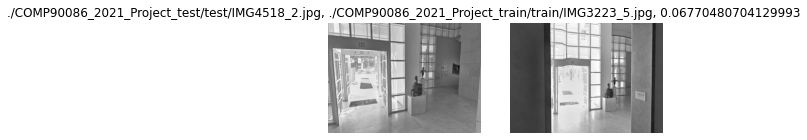

  0%|          | 1/1200 [00:14<4:48:51, 14.46s/it]

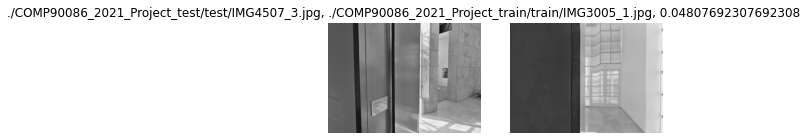

  0%|          | 2/1200 [00:24<3:54:43, 11.76s/it]

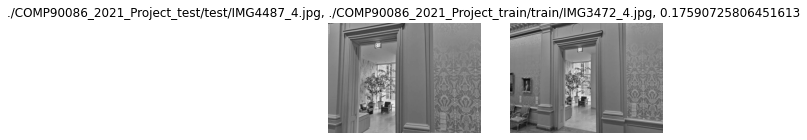

  0%|          | 3/1200 [00:37<4:10:16, 12.54s/it]

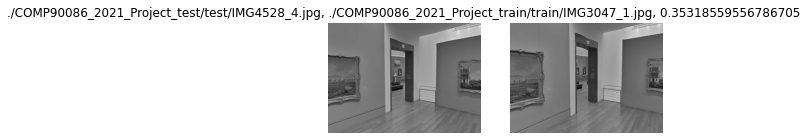

  0%|          | 4/1200 [00:49<4:02:50, 12.18s/it]

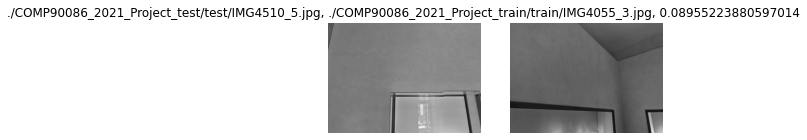

  0%|          | 5/1200 [00:58<3:38:37, 10.98s/it]

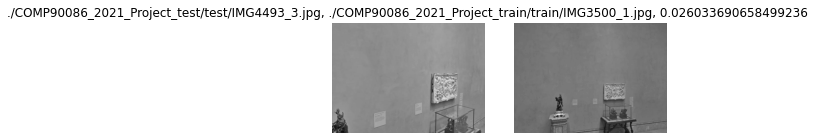

  0%|          | 6/1200 [01:07<3:28:50, 10.49s/it]

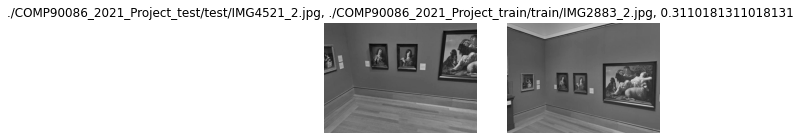

  1%|          | 7/1200 [01:19<3:35:03, 10.82s/it]

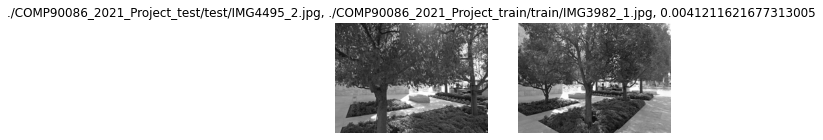

  1%|          | 8/1200 [02:05<7:15:37, 21.93s/it]

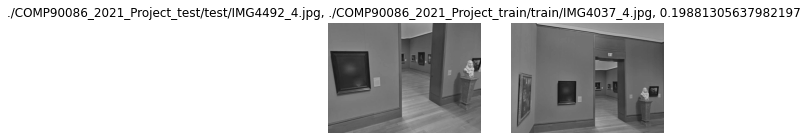

  1%|          | 9/1200 [02:15<6:02:46, 18.28s/it]

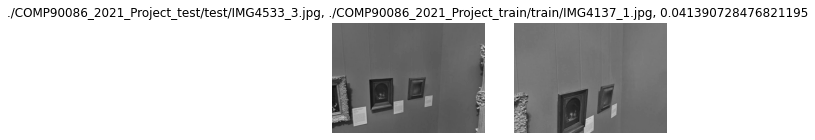

  1%|          | 10/1200 [02:26<5:17:57, 16.03s/it]

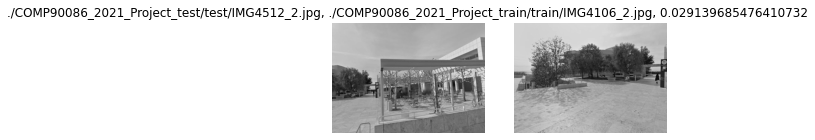

  1%|          | 11/1200 [02:52<6:21:56, 19.27s/it]

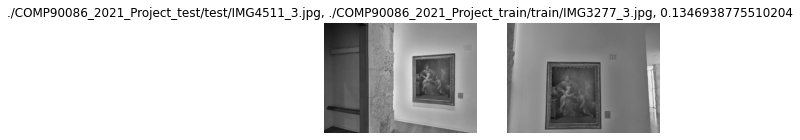

  1%|          | 12/1200 [03:03<5:28:39, 16.60s/it]

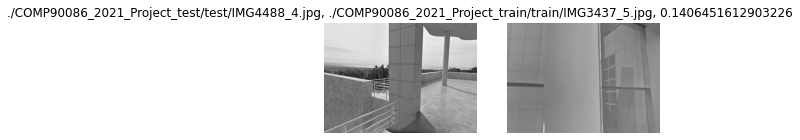

  1%|          | 13/1200 [03:16<5:05:37, 15.45s/it]

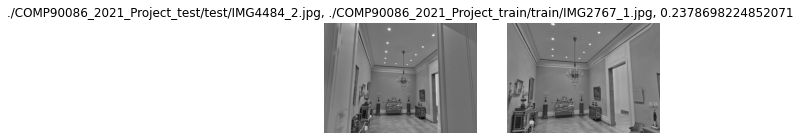

  1%|          | 14/1200 [03:26<4:37:12, 14.02s/it]

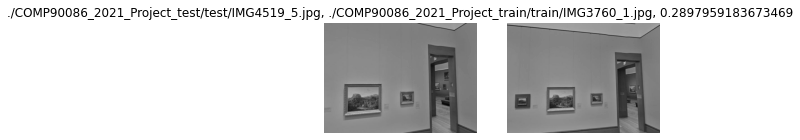

  1%|▏         | 15/1200 [03:37<4:16:12, 12.97s/it]

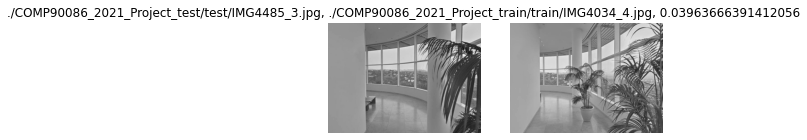

  1%|▏         | 16/1200 [03:48<4:02:19, 12.28s/it]

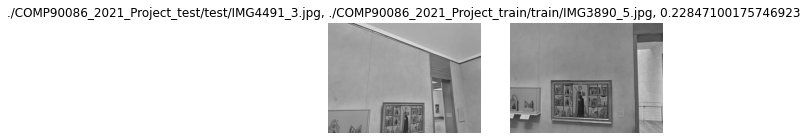

  1%|▏         | 17/1200 [03:58<3:50:42, 11.70s/it]

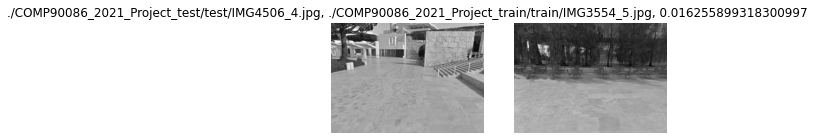

  2%|▏         | 18/1200 [04:16<4:26:23, 13.52s/it]

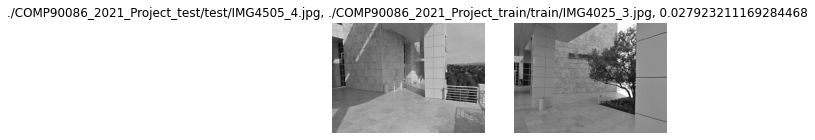

  2%|▏         | 19/1200 [04:29<4:22:47, 13.35s/it]

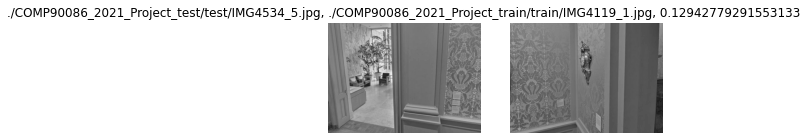

  2%|▏         | 20/1200 [04:42<4:22:22, 13.34s/it]

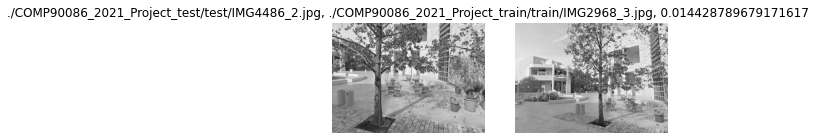

  2%|▏         | 21/1200 [06:05<11:11:02, 34.15s/it]

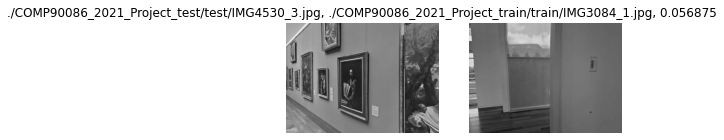

  2%|▏         | 22/1200 [06:16<8:54:09, 27.21s/it] 

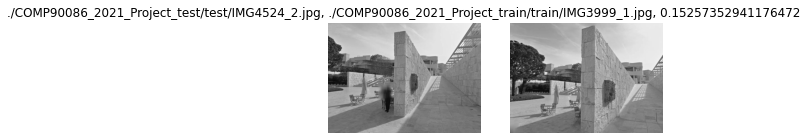

  2%|▏         | 23/1200 [06:32<7:49:46, 23.95s/it]

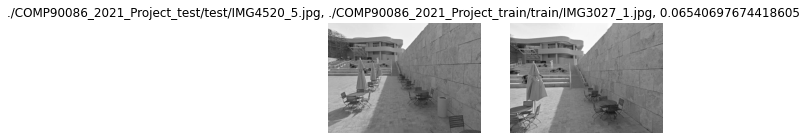

  2%|▏         | 24/1200 [06:50<7:14:22, 22.16s/it]

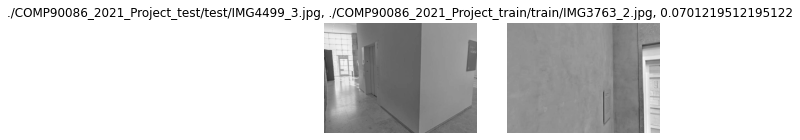

  2%|▏         | 25/1200 [07:00<5:59:50, 18.37s/it]

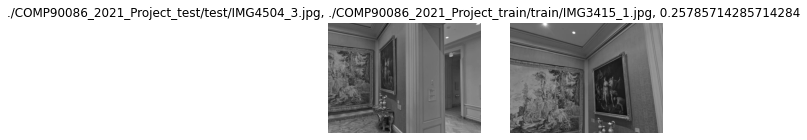

  2%|▏         | 26/1200 [07:15<5:42:47, 17.52s/it]

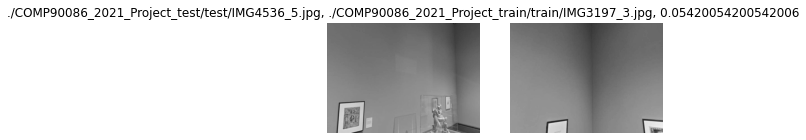

  2%|▏         | 27/1200 [07:25<4:58:40, 15.28s/it]

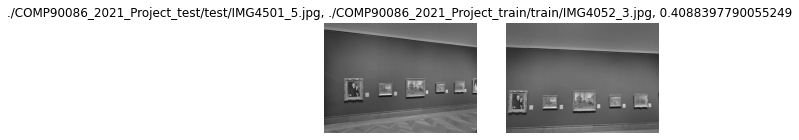

  2%|▏         | 28/1200 [07:36<4:32:03, 13.93s/it]

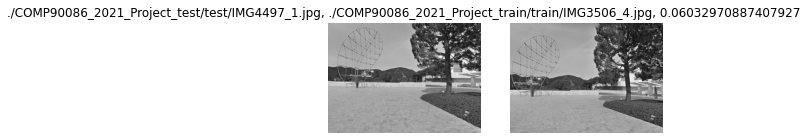

  2%|▏         | 29/1200 [08:12<6:44:06, 20.71s/it]

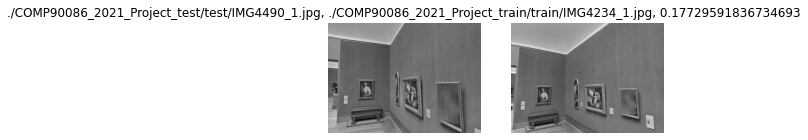

  2%|▎         | 30/1200 [08:24<5:49:01, 17.90s/it]

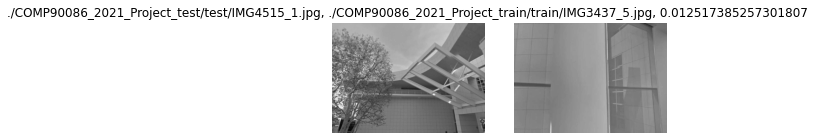

  3%|▎         | 31/1200 [08:44<6:00:40, 18.51s/it]

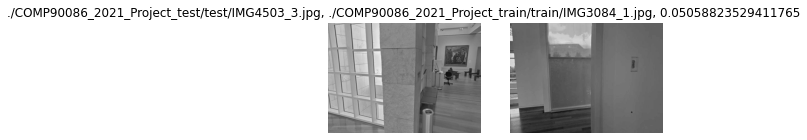

  3%|▎         | 32/1200 [08:55<5:17:43, 16.32s/it]

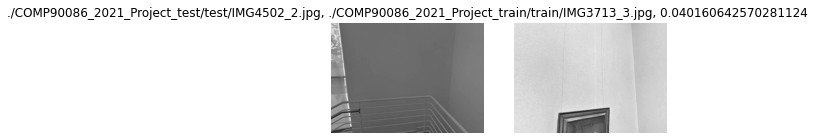

  3%|▎         | 33/1200 [09:04<4:33:53, 14.08s/it]

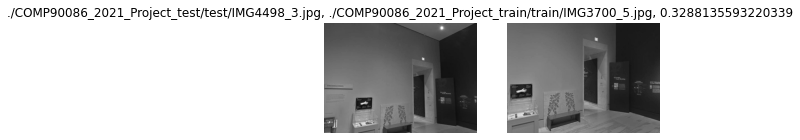

  3%|▎         | 34/1200 [09:14<4:12:41, 13.00s/it]

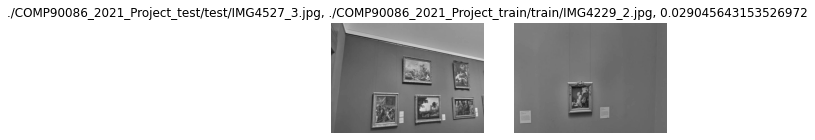

  3%|▎         | 35/1200 [09:27<4:09:47, 12.86s/it]

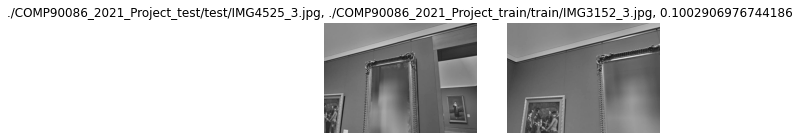

  3%|▎         | 36/1200 [09:38<3:59:48, 12.36s/it]

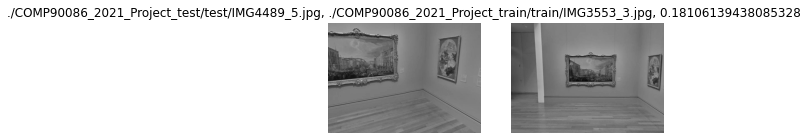

  3%|▎         | 37/1200 [09:50<3:59:57, 12.38s/it]

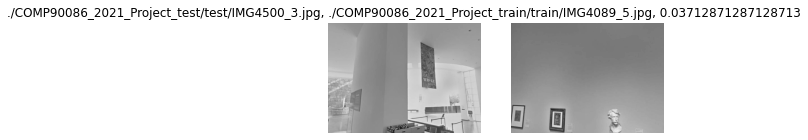

  3%|▎         | 38/1200 [10:01<3:49:12, 11.83s/it]

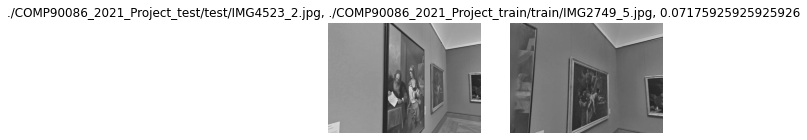

  3%|▎         | 39/1200 [10:11<3:39:58, 11.37s/it]

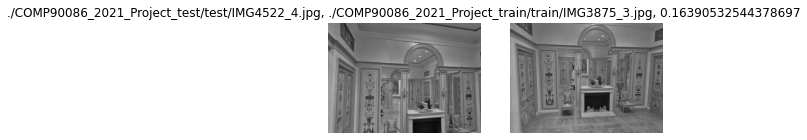

  3%|▎         | 40/1200 [10:26<3:59:25, 12.38s/it]

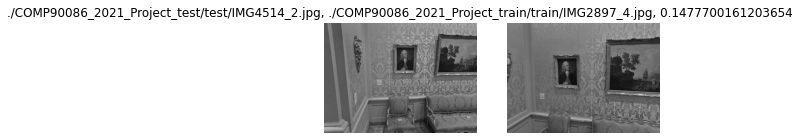

  3%|▎         | 41/1200 [10:37<3:50:43, 11.94s/it]

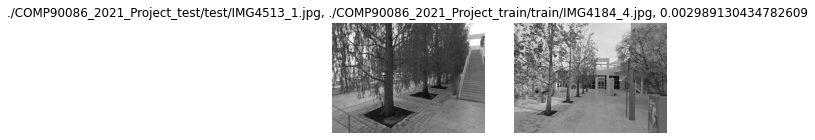

  4%|▎         | 42/1200 [11:29<7:43:44, 24.03s/it]

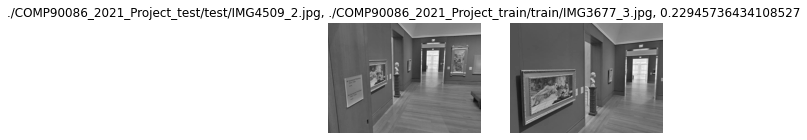

  4%|▎         | 43/1200 [11:40<6:27:03, 20.07s/it]

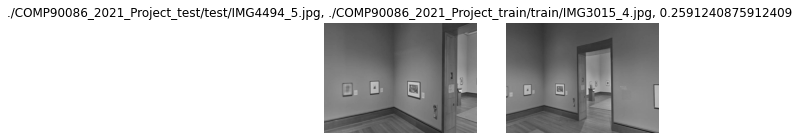

  4%|▎         | 44/1200 [11:50<5:26:40, 16.96s/it]

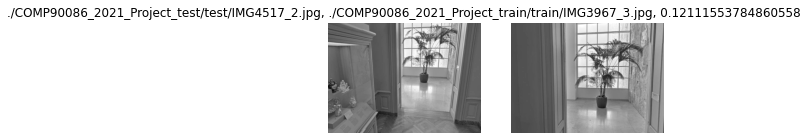

  4%|▍         | 45/1200 [12:03<5:02:31, 15.72s/it]

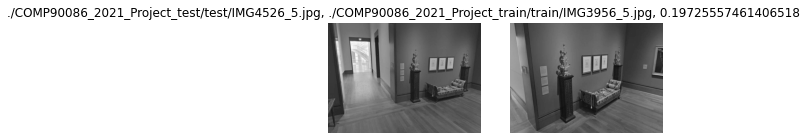

  4%|▍         | 46/1200 [12:13<4:29:19, 14.00s/it]

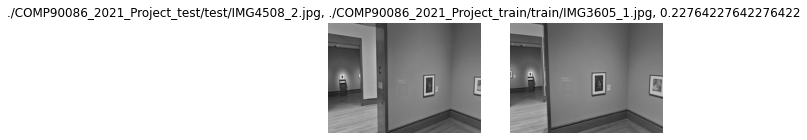

  4%|▍         | 47/1200 [12:22<4:04:11, 12.71s/it]

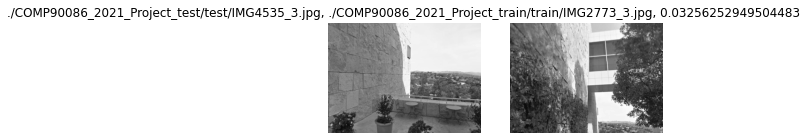

  4%|▍         | 48/1200 [12:43<4:50:37, 15.14s/it]

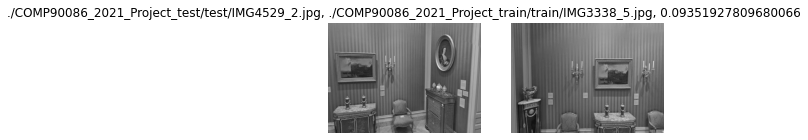

  4%|▍         | 49/1200 [12:57<4:43:11, 14.76s/it]

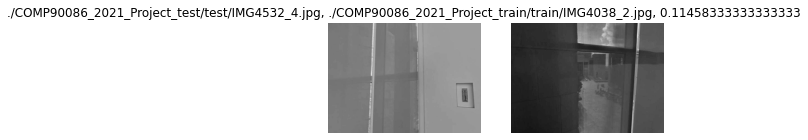

  4%|▍         | 50/1200 [13:06<4:08:39, 12.97s/it]

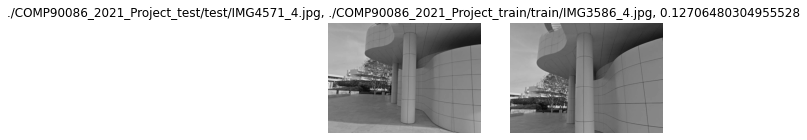

  4%|▍         | 51/1200 [13:16<3:55:20, 12.29s/it]

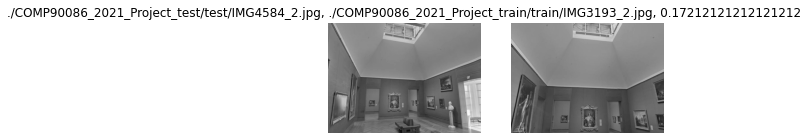

  4%|▍         | 52/1200 [13:28<3:53:02, 12.18s/it]

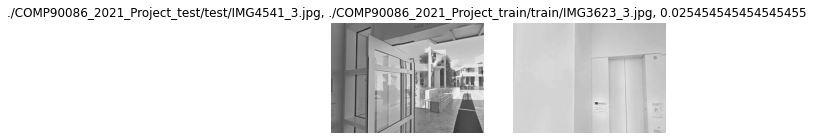

  4%|▍         | 53/1200 [13:40<3:48:10, 11.94s/it]

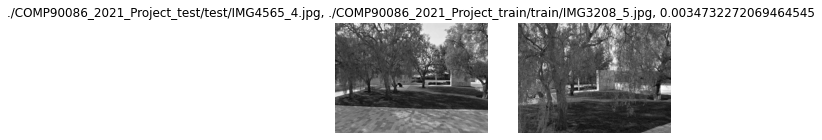

  4%|▍         | 54/1200 [14:08<5:21:52, 16.85s/it]

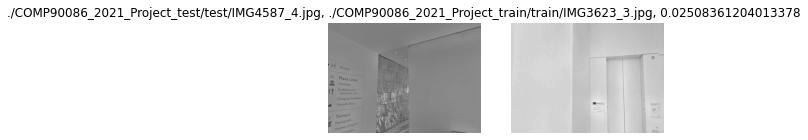

  5%|▍         | 55/1200 [14:18<4:39:32, 14.65s/it]

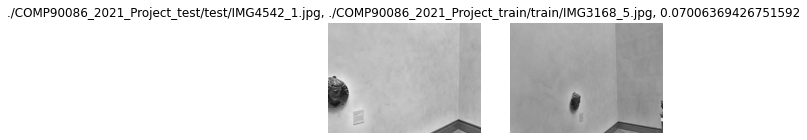

  5%|▍         | 56/1200 [14:27<4:06:52, 12.95s/it]

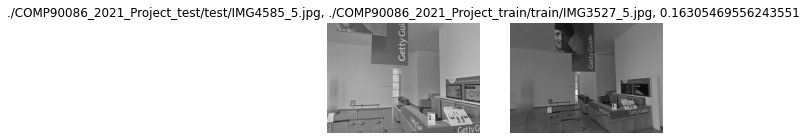

  5%|▍         | 57/1200 [14:37<3:54:41, 12.32s/it]

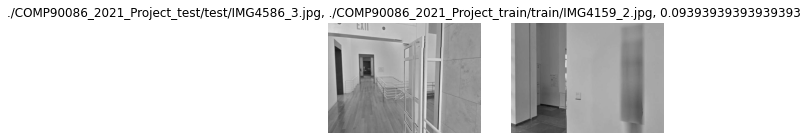

  5%|▍         | 58/1200 [14:47<3:41:10, 11.62s/it]

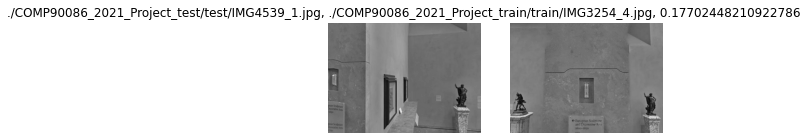

  5%|▍         | 59/1200 [14:58<3:34:57, 11.30s/it]

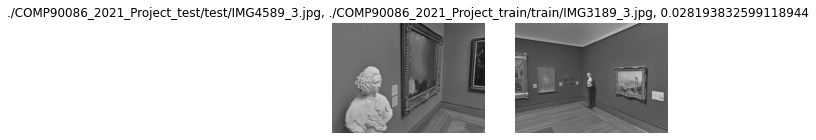

  5%|▌         | 60/1200 [15:11<3:42:53, 11.73s/it]

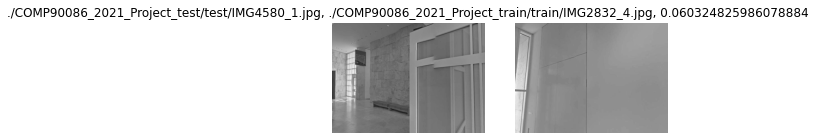

  5%|▌         | 61/1200 [15:20<3:31:44, 11.15s/it]

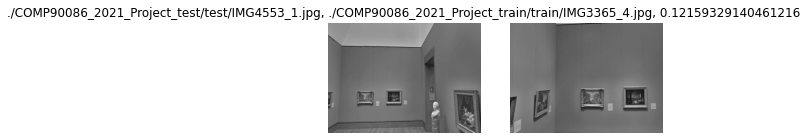

  5%|▌         | 62/1200 [15:31<3:27:04, 10.92s/it]

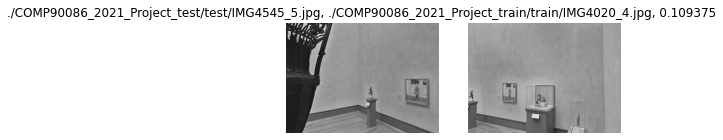

  5%|▌         | 63/1200 [15:40<3:18:42, 10.49s/it]

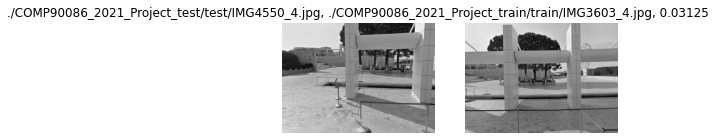

  5%|▌         | 64/1200 [15:57<3:55:27, 12.44s/it]

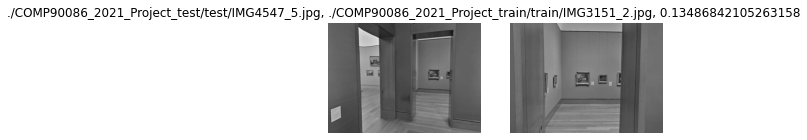

  5%|▌         | 65/1200 [16:07<3:39:13, 11.59s/it]

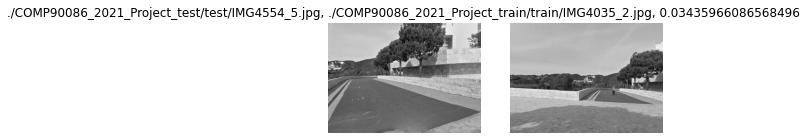

  6%|▌         | 66/1200 [16:35<5:11:09, 16.46s/it]

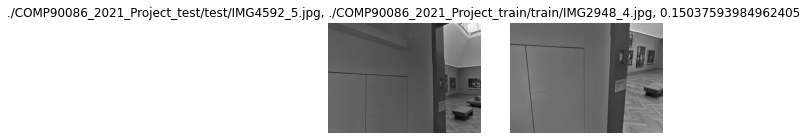

  6%|▌         | 67/1200 [16:44<4:28:50, 14.24s/it]

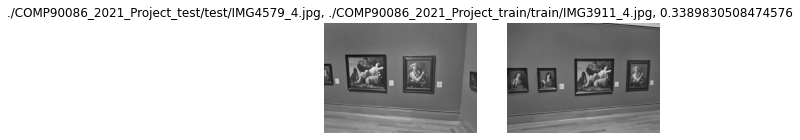

  6%|▌         | 68/1200 [16:56<4:14:41, 13.50s/it]

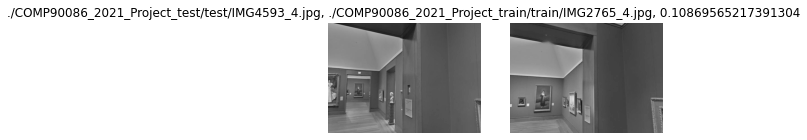

  6%|▌         | 69/1200 [17:05<3:53:11, 12.37s/it]

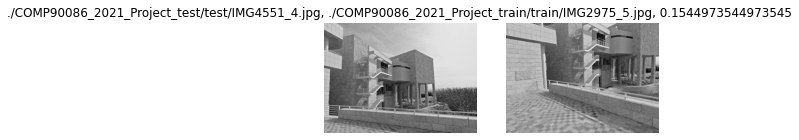

  6%|▌         | 70/1200 [17:24<4:31:22, 14.41s/it]

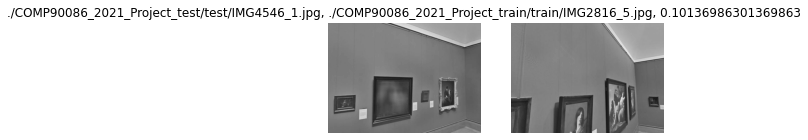

  6%|▌         | 71/1200 [17:35<4:07:05, 13.13s/it]

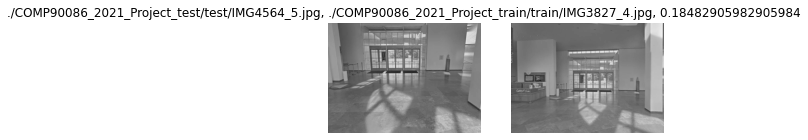

  6%|▌         | 72/1200 [17:46<3:57:32, 12.64s/it]

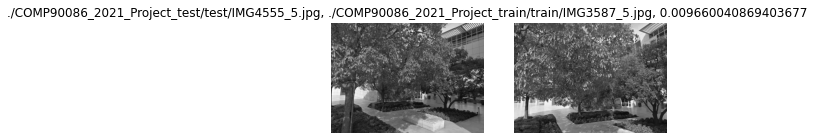

  6%|▌         | 73/1200 [18:34<7:17:12, 23.28s/it]

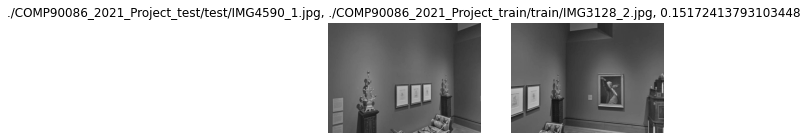

  6%|▌         | 74/1200 [18:45<6:04:55, 19.44s/it]

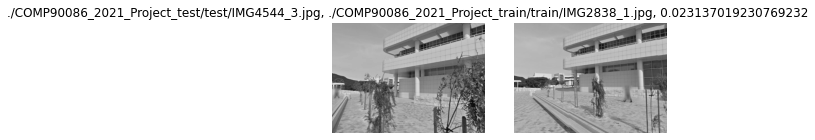

  6%|▋         | 75/1200 [19:10<6:38:28, 21.25s/it]

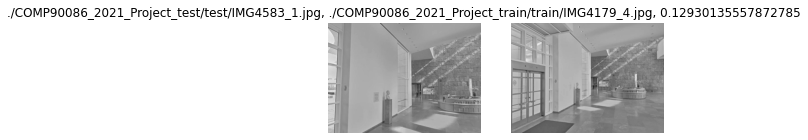

  6%|▋         | 76/1200 [19:20<5:34:58, 17.88s/it]

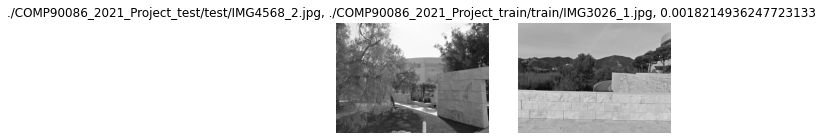

  6%|▋         | 77/1200 [19:43<6:01:51, 19.33s/it]

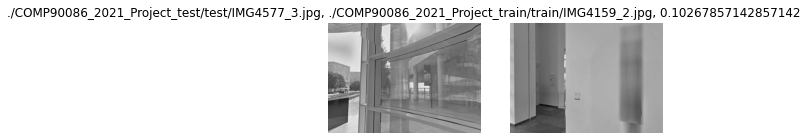

  6%|▋         | 78/1200 [19:54<5:14:08, 16.80s/it]

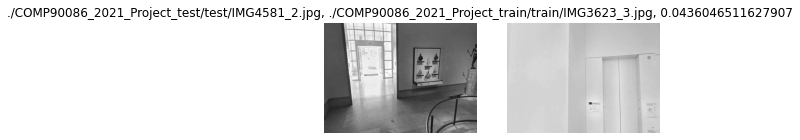

  7%|▋         | 79/1200 [20:04<4:39:21, 14.95s/it]

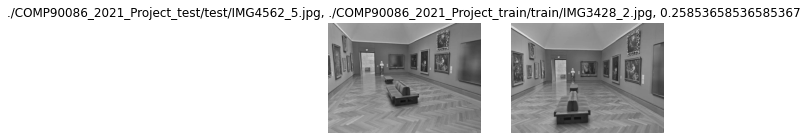

  7%|▋         | 80/1200 [20:16<4:21:18, 14.00s/it]

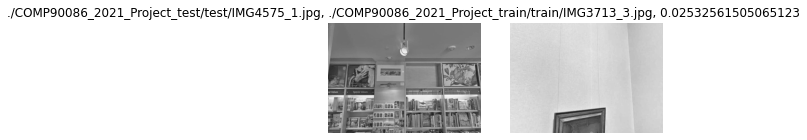

  7%|▋         | 81/1200 [20:33<4:39:19, 14.98s/it]

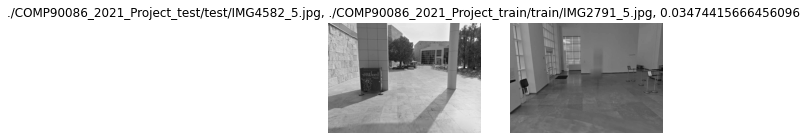

  7%|▋         | 82/1200 [20:52<5:00:11, 16.11s/it]

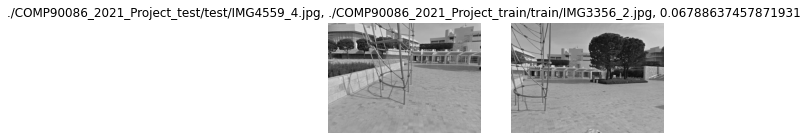

  7%|▋         | 83/1200 [21:15<5:38:11, 18.17s/it]

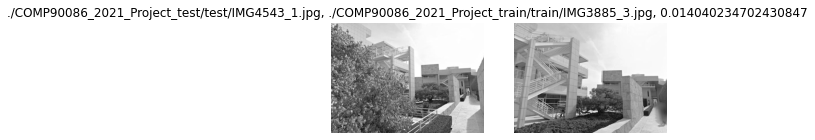

  7%|▋         | 84/1200 [21:52<7:20:04, 23.66s/it]

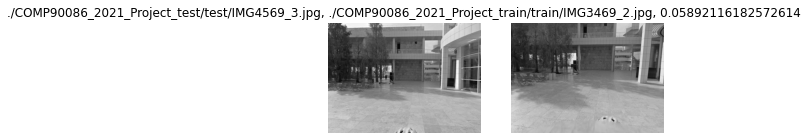

  7%|▋         | 85/1200 [22:09<6:45:30, 21.82s/it]

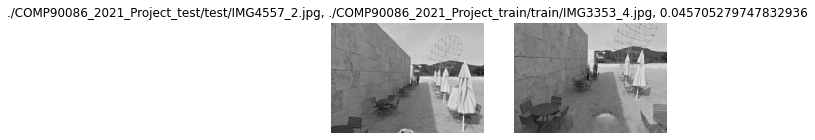

  7%|▋         | 86/1200 [22:26<6:17:30, 20.33s/it]

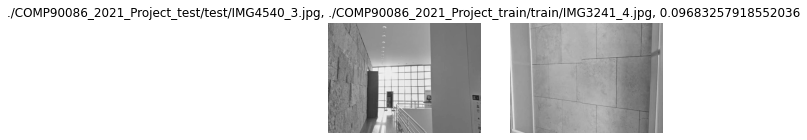

  7%|▋         | 87/1200 [22:37<5:22:57, 17.41s/it]

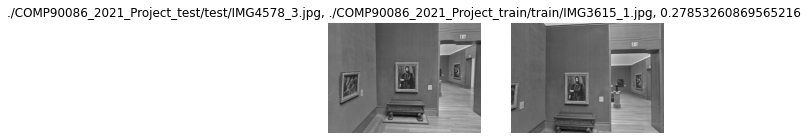

  7%|▋         | 88/1200 [22:48<4:51:40, 15.74s/it]

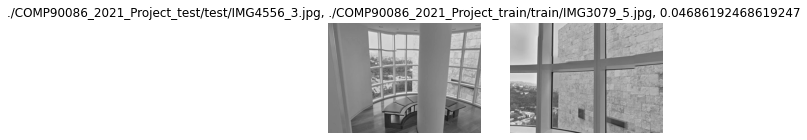

  7%|▋         | 89/1200 [22:59<4:23:36, 14.24s/it]

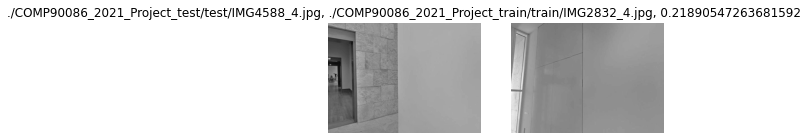

  8%|▊         | 90/1200 [23:09<3:56:15, 12.77s/it]

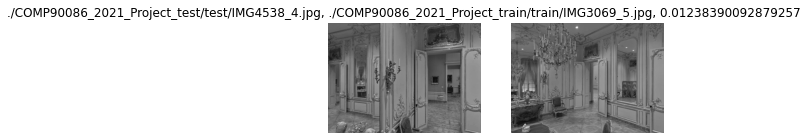

  8%|▊         | 91/1200 [23:25<4:16:09, 13.86s/it]

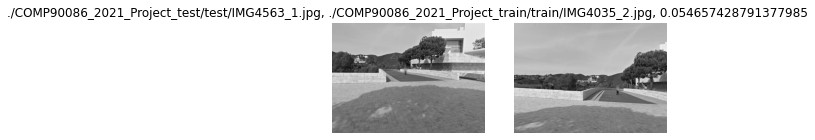

  8%|▊         | 92/1200 [23:39<4:14:59, 13.81s/it]

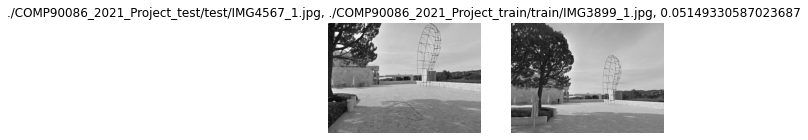

  8%|▊         | 93/1200 [23:59<4:51:06, 15.78s/it]

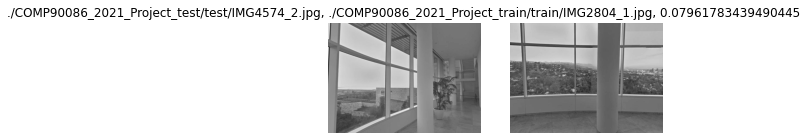

  8%|▊         | 94/1200 [24:12<4:34:07, 14.87s/it]

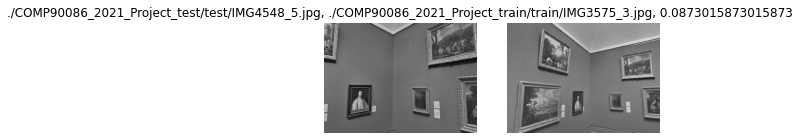

  8%|▊         | 95/1200 [24:26<4:28:35, 14.58s/it]

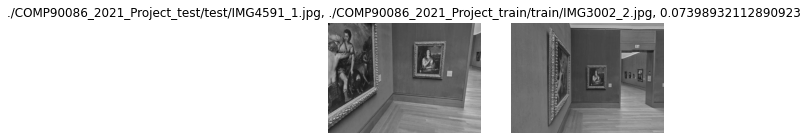

  8%|▊         | 96/1200 [24:39<4:23:46, 14.34s/it]

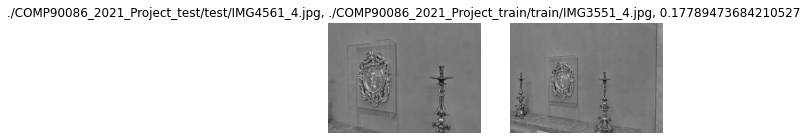

  8%|▊         | 97/1200 [24:53<4:18:23, 14.06s/it]

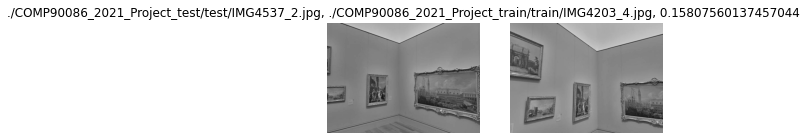

  8%|▊         | 98/1200 [25:05<4:06:50, 13.44s/it]

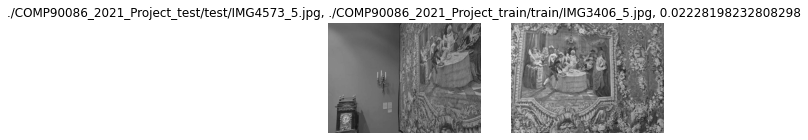

  8%|▊         | 99/1200 [25:23<4:33:34, 14.91s/it]

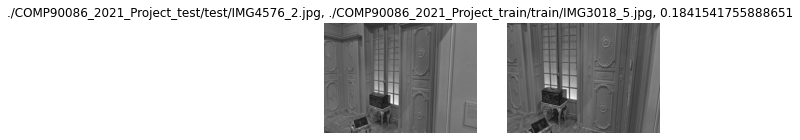

  8%|▊         | 100/1200 [25:38<4:31:55, 14.83s/it]

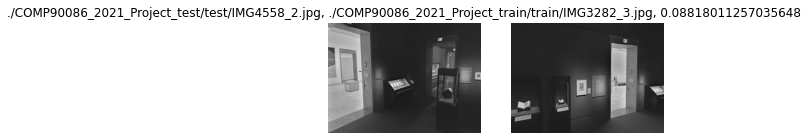

  8%|▊         | 101/1200 [25:49<4:08:55, 13.59s/it]

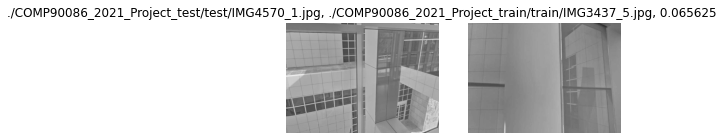

  8%|▊         | 102/1200 [25:58<3:48:02, 12.46s/it]

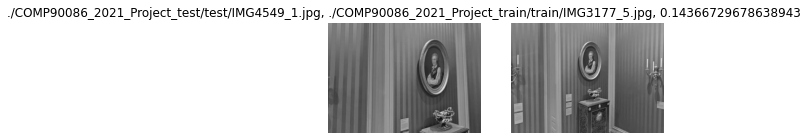

  9%|▊         | 103/1200 [26:09<3:39:09, 11.99s/it]

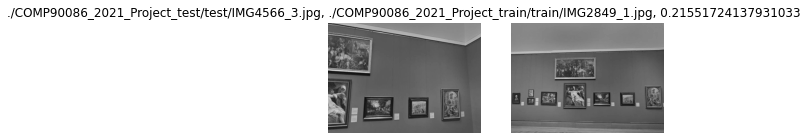

  9%|▊         | 104/1200 [26:22<3:44:15, 12.28s/it]

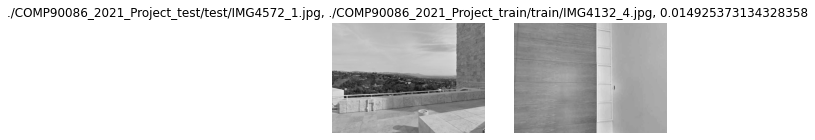

  9%|▉         | 105/1200 [26:37<3:59:48, 13.14s/it]

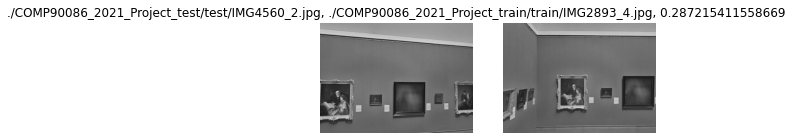

  9%|▉         | 106/1200 [26:48<3:48:22, 12.53s/it]

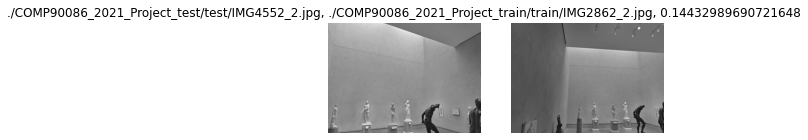

  9%|▉         | 107/1200 [26:59<3:34:53, 11.80s/it]

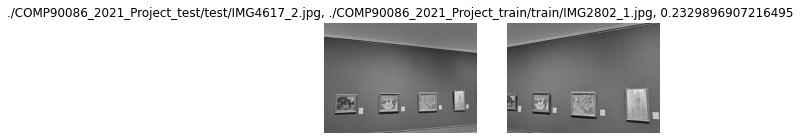

  9%|▉         | 108/1200 [27:09<3:26:45, 11.36s/it]

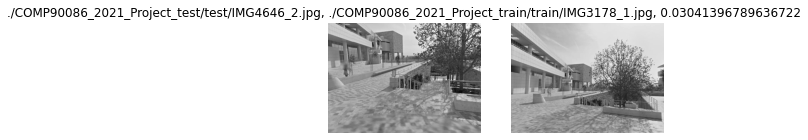

  9%|▉         | 109/1200 [27:44<5:36:49, 18.52s/it]

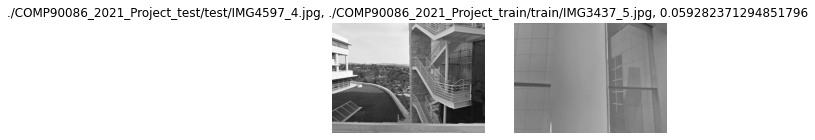

  9%|▉         | 110/1200 [27:59<5:15:05, 17.34s/it]

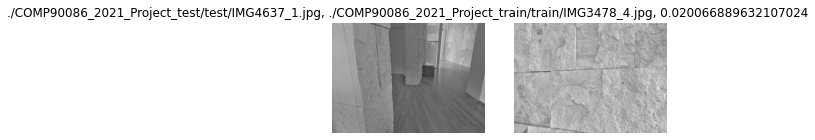

  9%|▉         | 111/1200 [28:08<4:30:48, 14.92s/it]

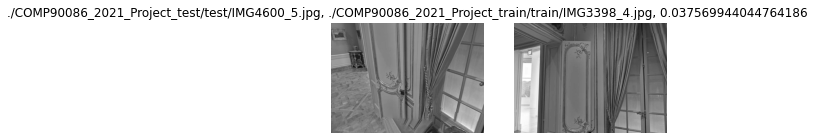

  9%|▉         | 112/1200 [28:18<4:05:47, 13.55s/it]

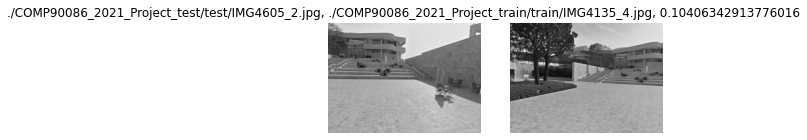

  9%|▉         | 113/1200 [28:34<4:16:45, 14.17s/it]

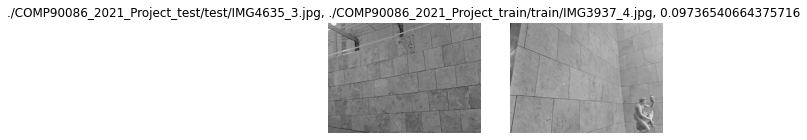

 10%|▉         | 114/1200 [28:48<4:17:55, 14.25s/it]

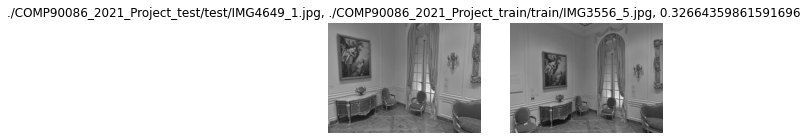

 10%|▉         | 115/1200 [29:05<4:30:37, 14.96s/it]

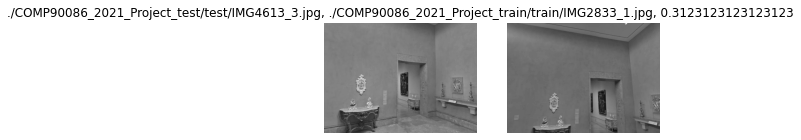

 10%|▉         | 116/1200 [29:16<4:09:20, 13.80s/it]

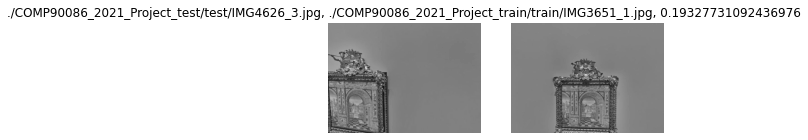

 10%|▉         | 117/1200 [29:29<4:04:59, 13.57s/it]

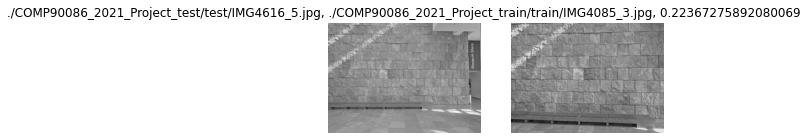

 10%|▉         | 118/1200 [29:45<4:15:25, 14.16s/it]

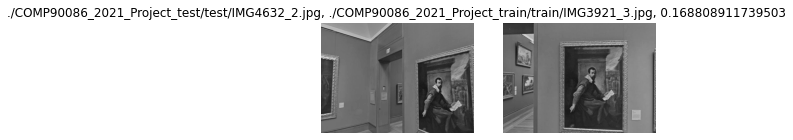

 10%|▉         | 119/1200 [29:57<4:07:32, 13.74s/it]

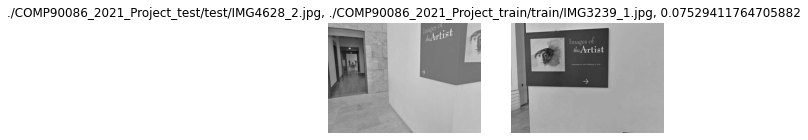

 10%|█         | 120/1200 [30:07<3:44:56, 12.50s/it]

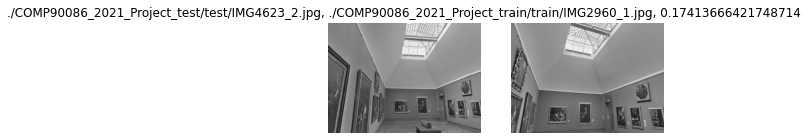

 10%|█         | 121/1200 [30:19<3:39:41, 12.22s/it]

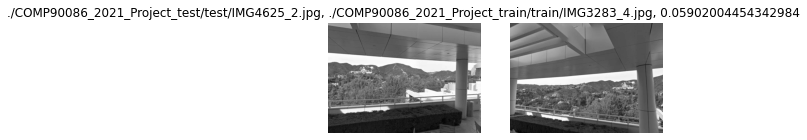

 10%|█         | 122/1200 [30:33<3:53:23, 12.99s/it]

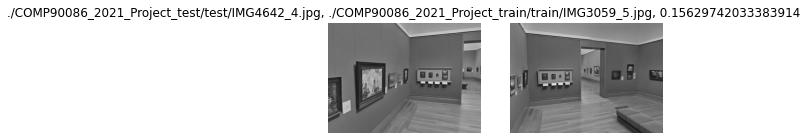

 10%|█         | 123/1200 [30:45<3:45:22, 12.56s/it]

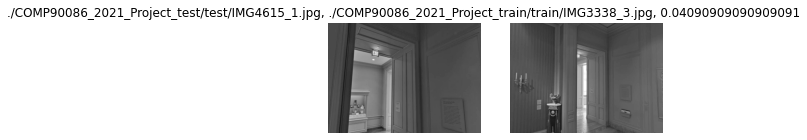

 10%|█         | 124/1200 [30:54<3:28:52, 11.65s/it]

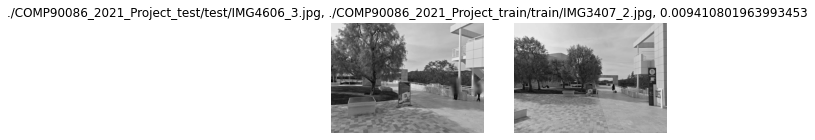

 10%|█         | 125/1200 [31:23<4:57:13, 16.59s/it]

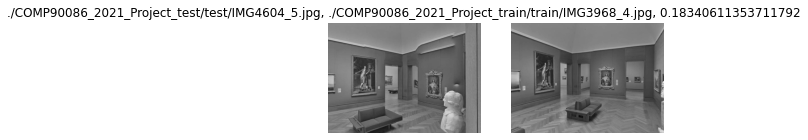

 10%|█         | 126/1200 [31:34<4:28:08, 14.98s/it]

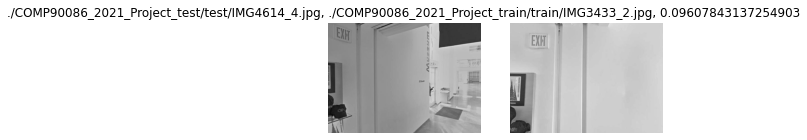

 11%|█         | 127/1200 [31:43<3:58:50, 13.36s/it]

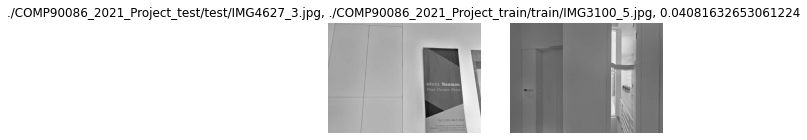

 11%|█         | 128/1200 [31:52<3:35:03, 12.04s/it]

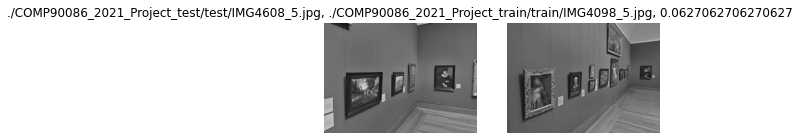

 11%|█         | 129/1200 [32:03<3:30:05, 11.77s/it]

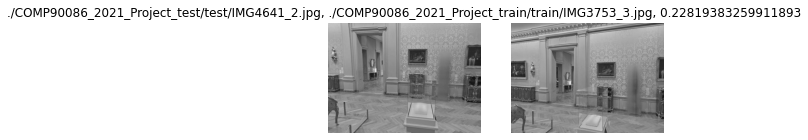

 11%|█         | 130/1200 [32:17<3:39:45, 12.32s/it]

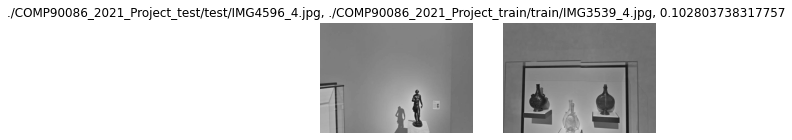

 11%|█         | 131/1200 [32:27<3:23:56, 11.45s/it]

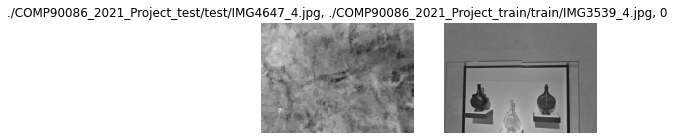

 11%|█         | 132/1200 [32:35<3:10:03, 10.68s/it]

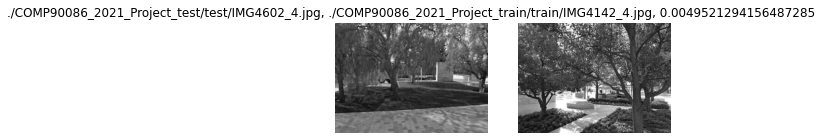

 11%|█         | 133/1200 [33:00<4:23:57, 14.84s/it]

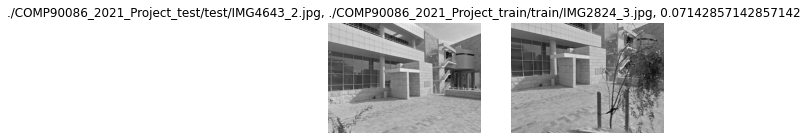

 11%|█         | 134/1200 [33:22<5:02:42, 17.04s/it]

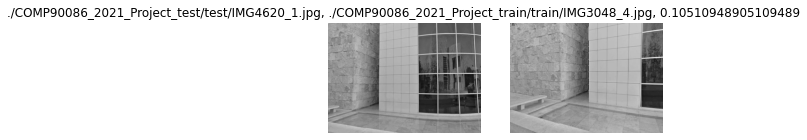

 11%|█▏        | 135/1200 [33:34<4:34:54, 15.49s/it]

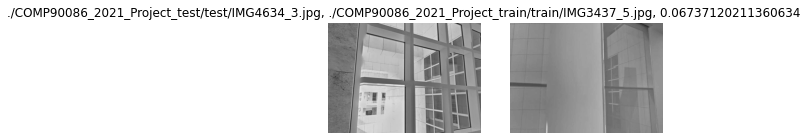

 11%|█▏        | 136/1200 [33:44<4:03:34, 13.74s/it]

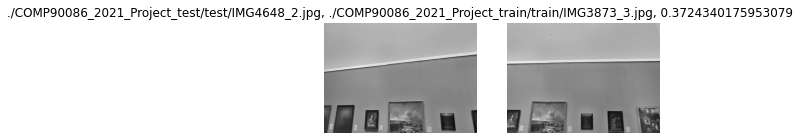

 11%|█▏        | 137/1200 [33:54<3:43:26, 12.61s/it]

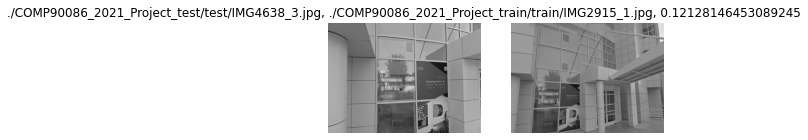

 12%|█▏        | 138/1200 [34:04<3:32:32, 12.01s/it]

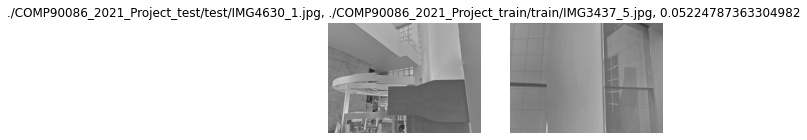

 12%|█▏        | 139/1200 [34:14<3:22:56, 11.48s/it]

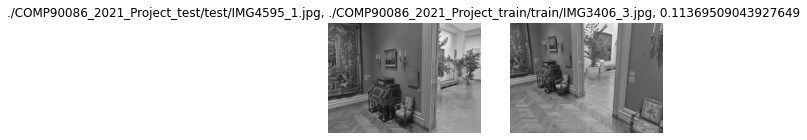

 12%|█▏        | 140/1200 [34:34<4:07:49, 14.03s/it]

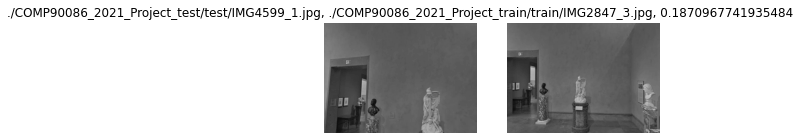

 12%|█▏        | 141/1200 [34:44<3:44:01, 12.69s/it]

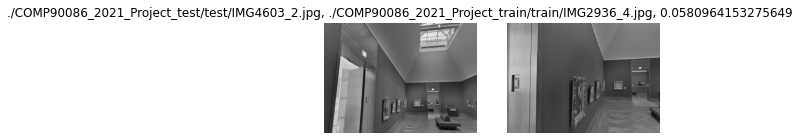

 12%|█▏        | 142/1200 [34:55<3:33:17, 12.10s/it]

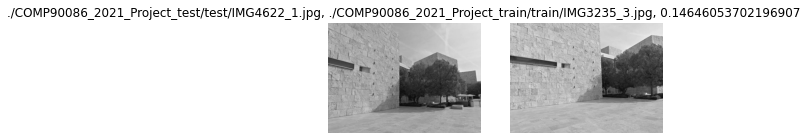

 12%|█▏        | 143/1200 [35:12<3:58:26, 13.53s/it]

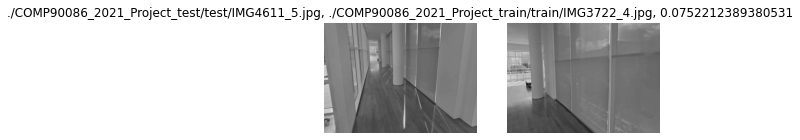

 12%|█▏        | 144/1200 [35:21<3:35:11, 12.23s/it]

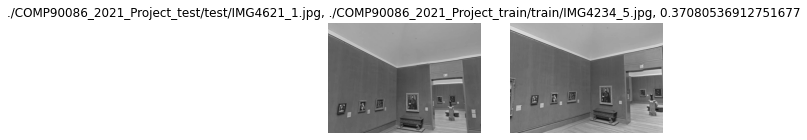

 12%|█▏        | 145/1200 [35:32<3:27:49, 11.82s/it]

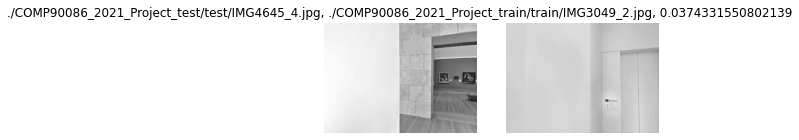

 12%|█▏        | 146/1200 [35:41<3:12:51, 10.98s/it]

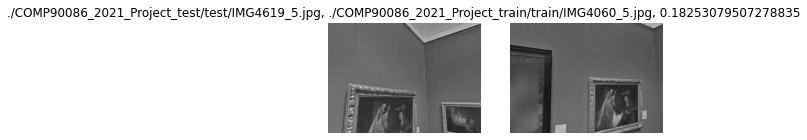

 12%|█▏        | 147/1200 [35:52<3:16:10, 11.18s/it]

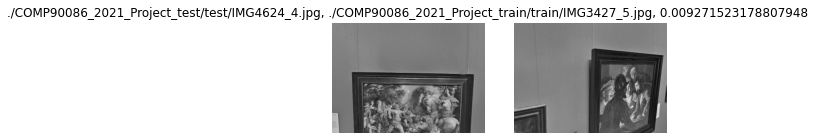

 12%|█▏        | 148/1200 [36:07<3:32:16, 12.11s/it]

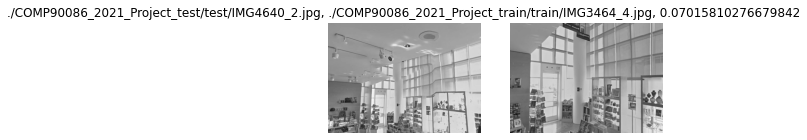

 12%|█▏        | 149/1200 [36:21<3:44:14, 12.80s/it]

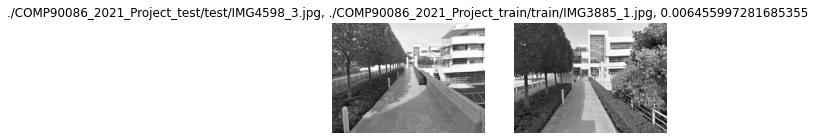

 12%|█▎        | 150/1200 [36:43<4:33:50, 15.65s/it]

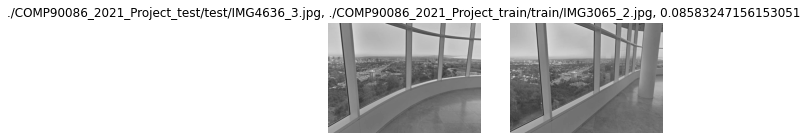

 13%|█▎        | 151/1200 [36:55<4:11:07, 14.36s/it]

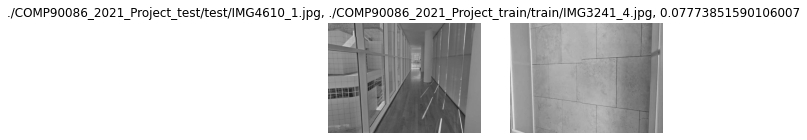

 13%|█▎        | 152/1200 [37:05<3:49:53, 13.16s/it]

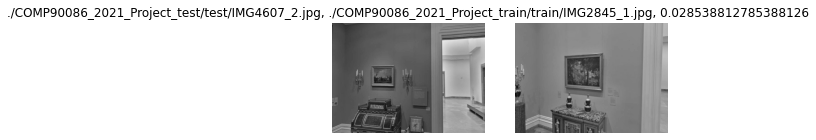

 13%|█▎        | 153/1200 [37:18<3:49:26, 13.15s/it]

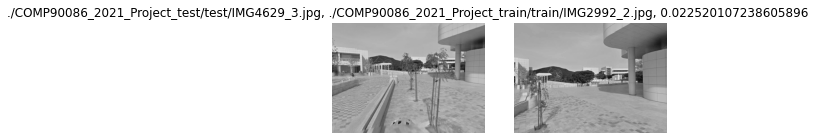

 13%|█▎        | 154/1200 [37:41<4:41:26, 16.14s/it]

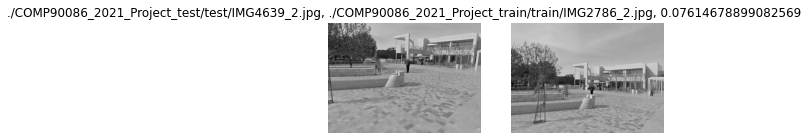

 13%|█▎        | 155/1200 [38:08<5:34:28, 19.20s/it]

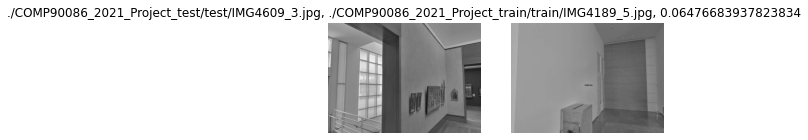

 13%|█▎        | 156/1200 [38:18<4:48:31, 16.58s/it]

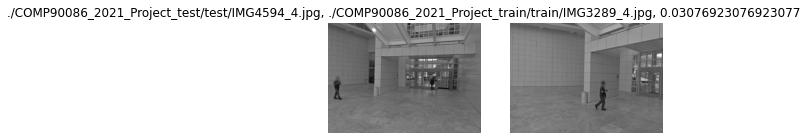

 13%|█▎        | 157/1200 [38:29<4:19:40, 14.94s/it]

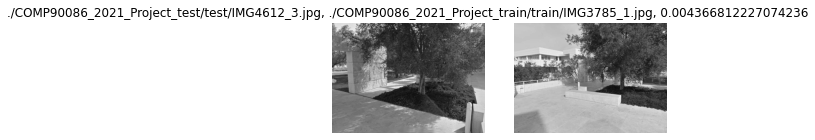

 13%|█▎        | 158/1200 [38:55<5:14:16, 18.10s/it]

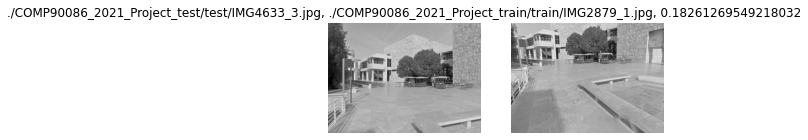

 13%|█▎        | 159/1200 [39:21<5:59:02, 20.69s/it]

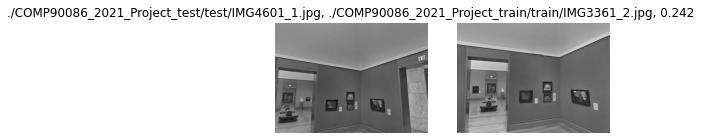

 13%|█▎        | 160/1200 [39:32<5:06:21, 17.67s/it]

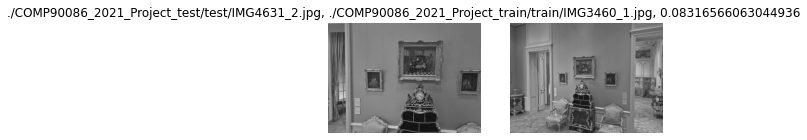

 13%|█▎        | 161/1200 [39:47<4:52:33, 16.89s/it]

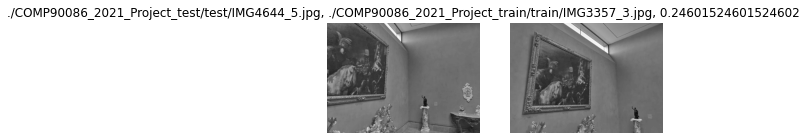

 14%|█▎        | 162/1200 [40:01<4:35:56, 15.95s/it]

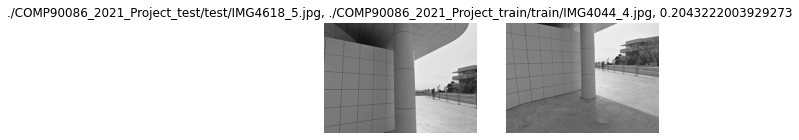

 14%|█▎        | 163/1200 [40:13<4:15:20, 14.77s/it]

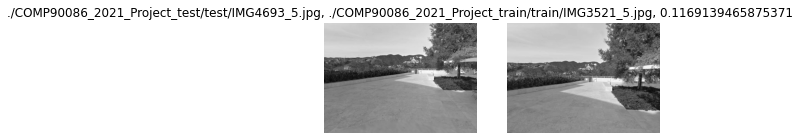

 14%|█▎        | 164/1200 [40:28<4:18:42, 14.98s/it]

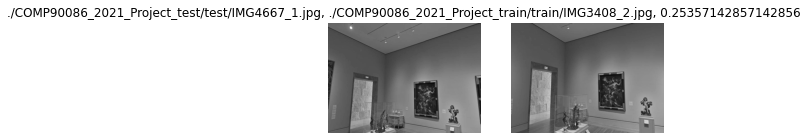

 14%|█▍        | 165/1200 [40:40<4:02:23, 14.05s/it]

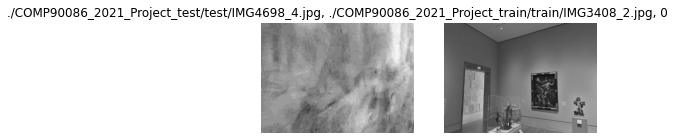

 14%|█▍        | 166/1200 [40:49<3:33:57, 12.42s/it]

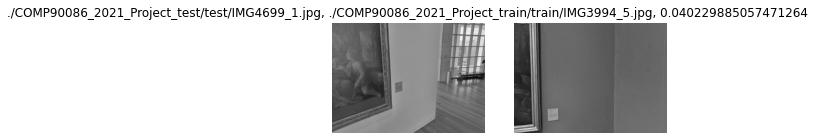

 14%|█▍        | 167/1200 [41:00<3:26:56, 12.02s/it]

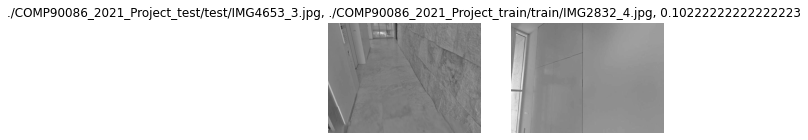

 14%|█▍        | 168/1200 [41:09<3:13:07, 11.23s/it]

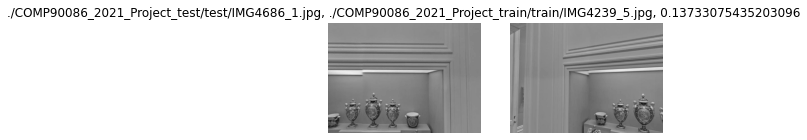

 14%|█▍        | 169/1200 [41:19<3:05:57, 10.82s/it]

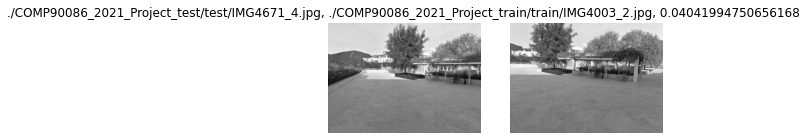

 14%|█▍        | 170/1200 [41:39<3:50:45, 13.44s/it]

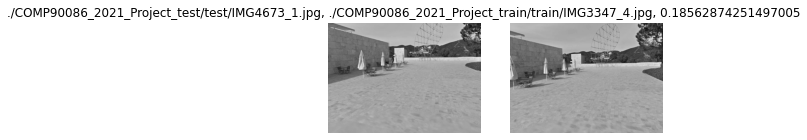

 14%|█▍        | 171/1200 [41:55<4:02:50, 14.16s/it]

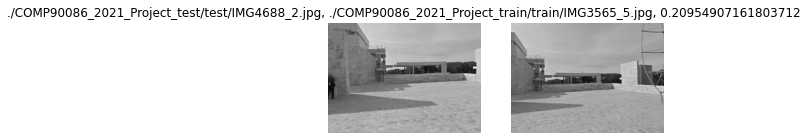

 14%|█▍        | 172/1200 [42:08<3:57:33, 13.87s/it]

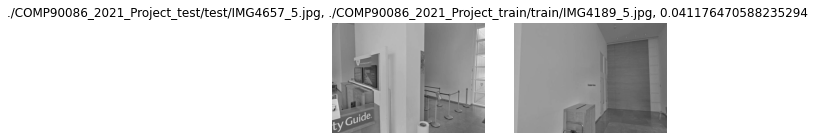

 14%|█▍        | 173/1200 [42:17<3:34:57, 12.56s/it]

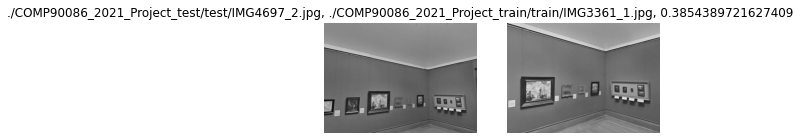

 14%|█▍        | 174/1200 [42:28<3:23:14, 11.89s/it]

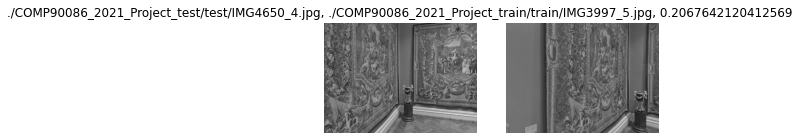

 15%|█▍        | 175/1200 [43:19<6:45:53, 23.76s/it]

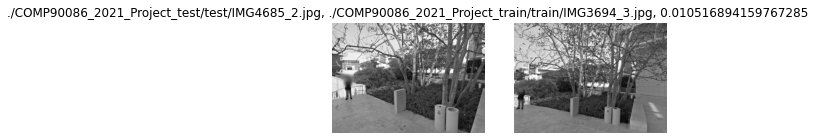

 15%|█▍        | 176/1200 [44:04<8:33:52, 30.11s/it]

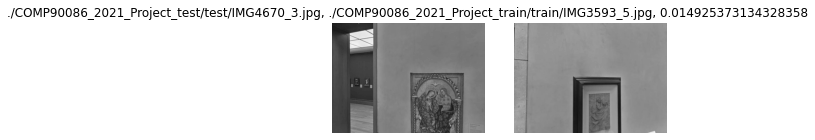

 15%|█▍        | 177/1200 [44:18<7:08:55, 25.16s/it]

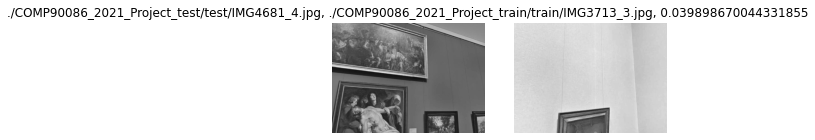

 15%|█▍        | 178/1200 [44:32<6:12:06, 21.85s/it]

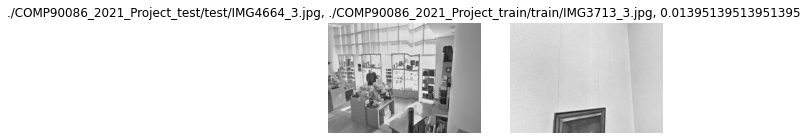

 15%|█▍        | 179/1200 [44:43<5:17:13, 18.64s/it]

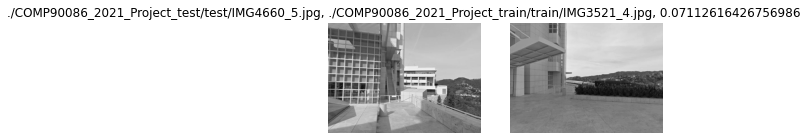

 15%|█▌        | 180/1200 [45:04<5:28:18, 19.31s/it]

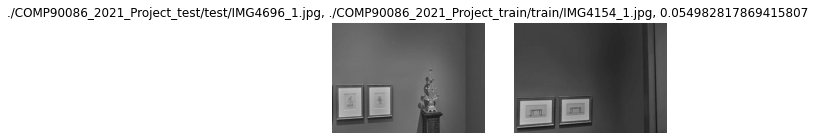

 15%|█▌        | 181/1200 [45:14<4:40:34, 16.52s/it]

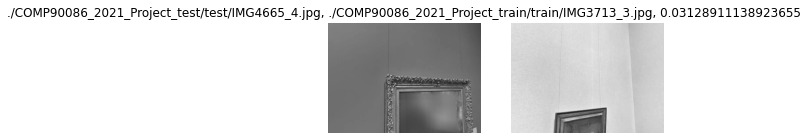

 15%|█▌        | 182/1200 [45:23<4:05:15, 14.46s/it]

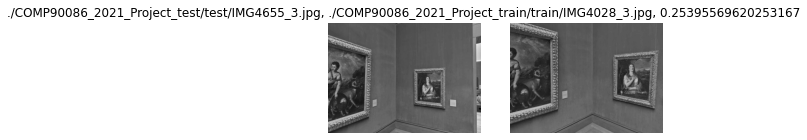

 15%|█▌        | 183/1200 [45:38<4:06:12, 14.53s/it]

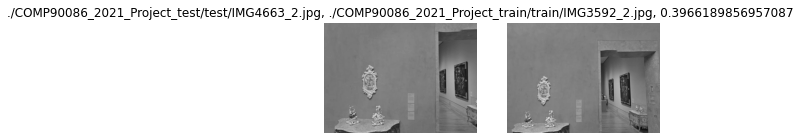

 15%|█▌        | 184/1200 [45:49<3:47:01, 13.41s/it]

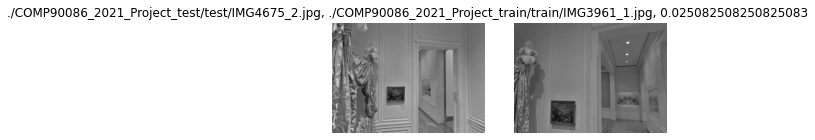

 15%|█▌        | 185/1200 [46:00<3:35:11, 12.72s/it]

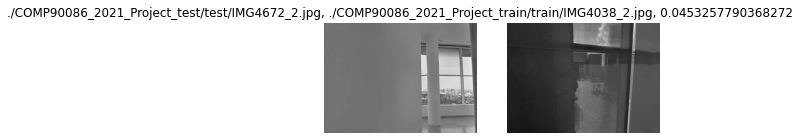

 16%|█▌        | 186/1200 [46:09<3:16:23, 11.62s/it]

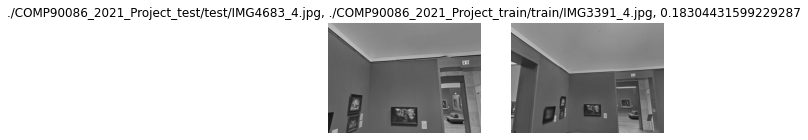

 16%|█▌        | 187/1200 [46:20<3:10:48, 11.30s/it]

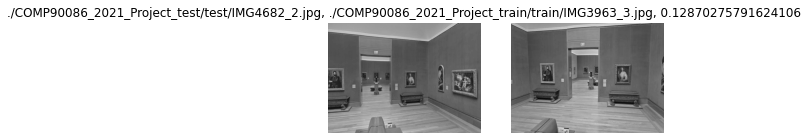

 16%|█▌        | 188/1200 [46:32<3:18:07, 11.75s/it]

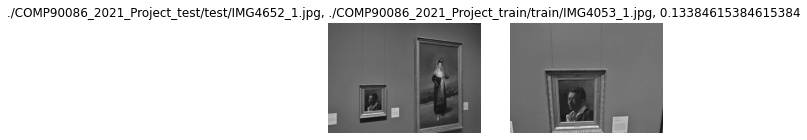

 16%|█▌        | 189/1200 [46:43<3:14:01, 11.51s/it]

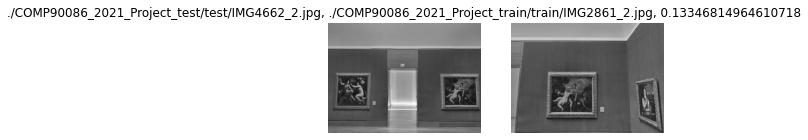

 16%|█▌        | 190/1200 [46:53<3:06:11, 11.06s/it]

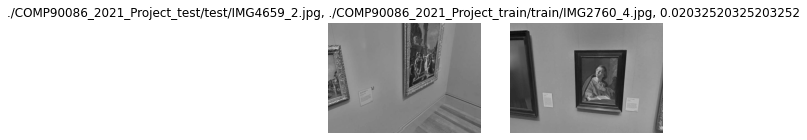

 16%|█▌        | 191/1200 [47:05<3:10:26, 11.32s/it]

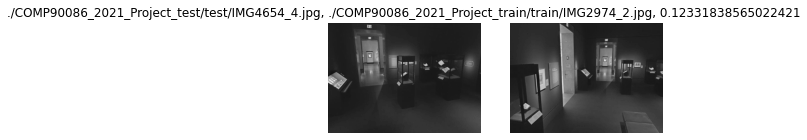

 16%|█▌        | 192/1200 [47:14<2:58:43, 10.64s/it]

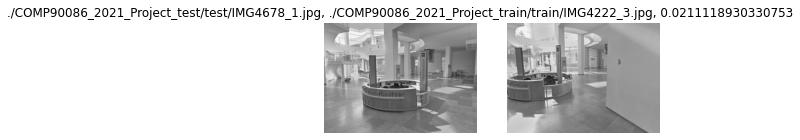

 16%|█▌        | 193/1200 [47:29<3:16:50, 11.73s/it]

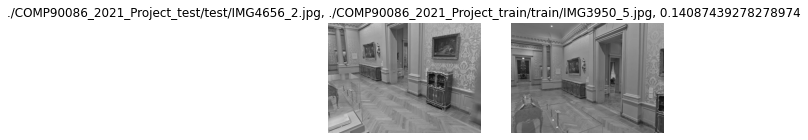

 16%|█▌        | 194/1200 [47:44<3:33:43, 12.75s/it]

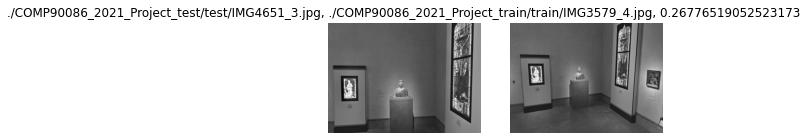

 16%|█▋        | 195/1200 [47:55<3:27:01, 12.36s/it]

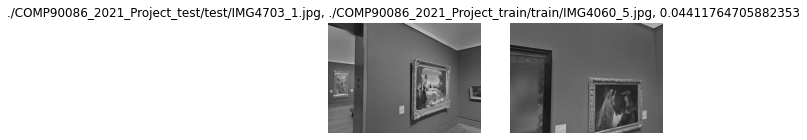

 16%|█▋        | 196/1200 [48:07<3:25:05, 12.26s/it]

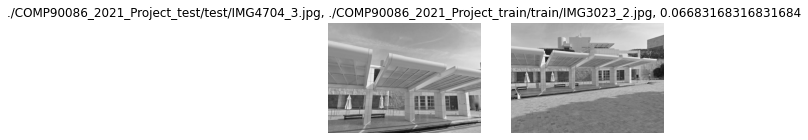

 16%|█▋        | 197/1200 [48:23<3:43:03, 13.34s/it]

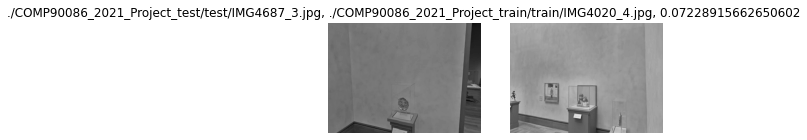

 16%|█▋        | 198/1200 [48:32<3:20:00, 11.98s/it]

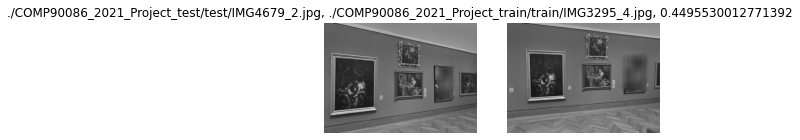

 17%|█▋        | 199/1200 [48:44<3:21:18, 12.07s/it]

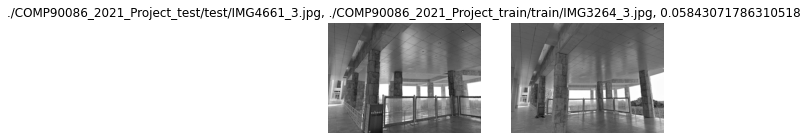

 17%|█▋        | 200/1200 [48:56<3:20:11, 12.01s/it]

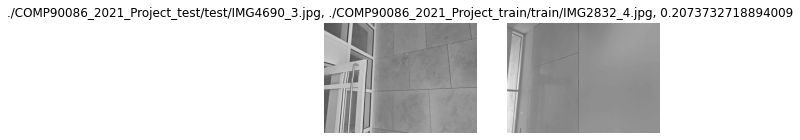

 17%|█▋        | 201/1200 [49:05<3:06:52, 11.22s/it]

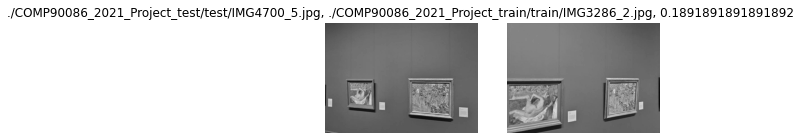

 17%|█▋        | 202/1200 [49:17<3:07:08, 11.25s/it]

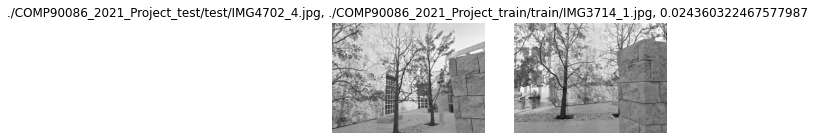

 17%|█▋        | 203/1200 [50:24<7:44:36, 27.96s/it]

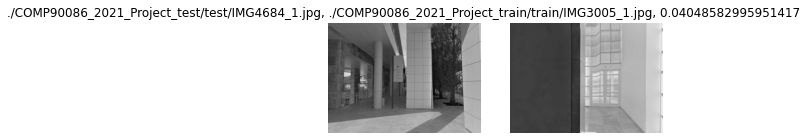

 17%|█▋        | 204/1200 [50:39<6:40:10, 24.11s/it]

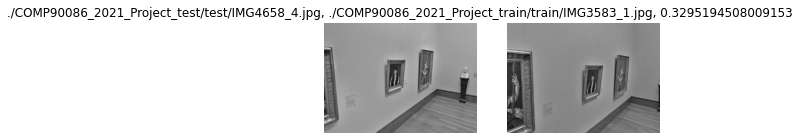

 17%|█▋        | 205/1200 [50:49<5:32:00, 20.02s/it]

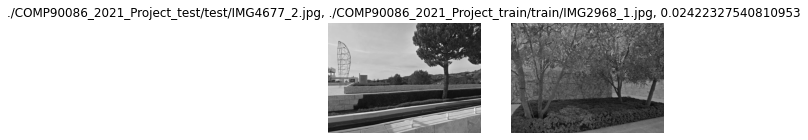

 17%|█▋        | 206/1200 [51:08<5:26:38, 19.72s/it]

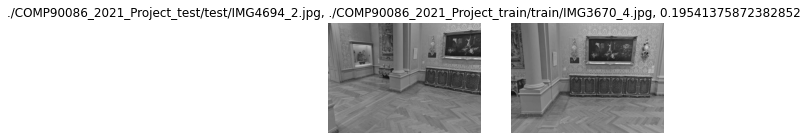

 17%|█▋        | 207/1200 [51:22<4:54:55, 17.82s/it]

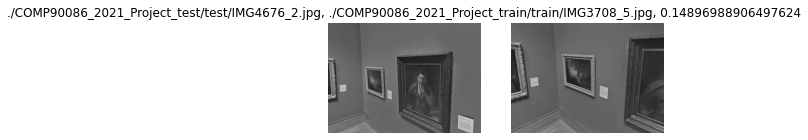

 17%|█▋        | 208/1200 [51:33<4:21:40, 15.83s/it]

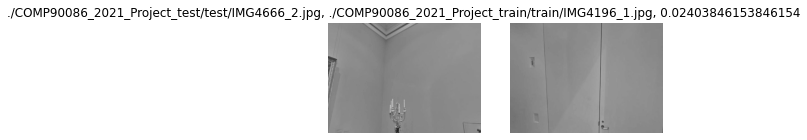

 17%|█▋        | 209/1200 [51:42<3:46:42, 13.73s/it]

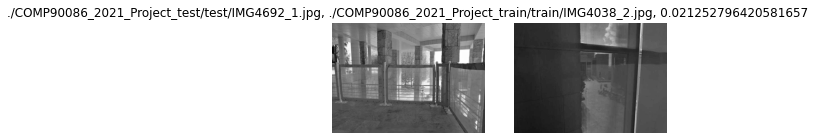

 18%|█▊        | 210/1200 [51:57<3:53:22, 14.14s/it]

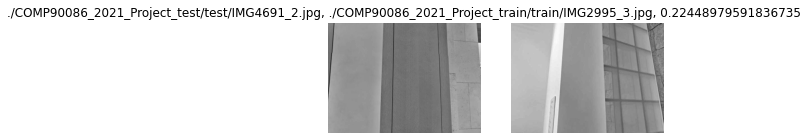

 18%|█▊        | 211/1200 [52:06<3:30:55, 12.80s/it]

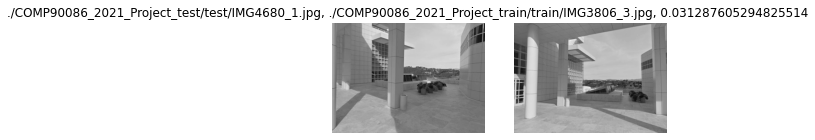

 18%|█▊        | 212/1200 [52:23<3:47:56, 13.84s/it]

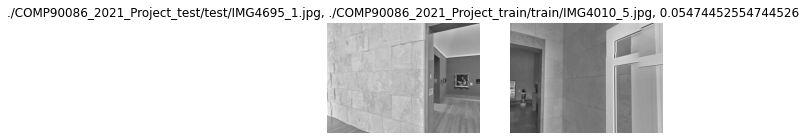

 18%|█▊        | 213/1200 [52:33<3:29:47, 12.75s/it]

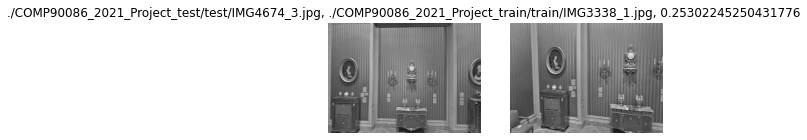

 18%|█▊        | 214/1200 [52:48<3:41:32, 13.48s/it]

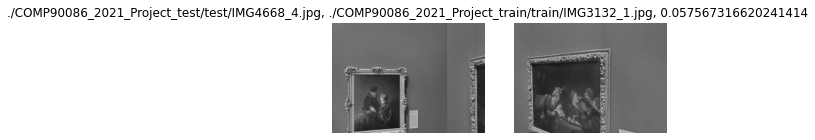

 18%|█▊        | 215/1200 [53:02<3:42:00, 13.52s/it]

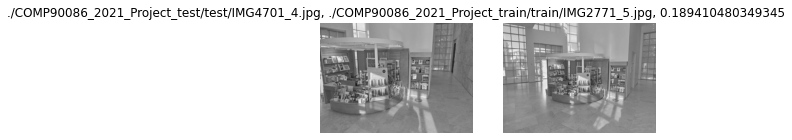

 18%|█▊        | 216/1200 [53:16<3:45:53, 13.77s/it]

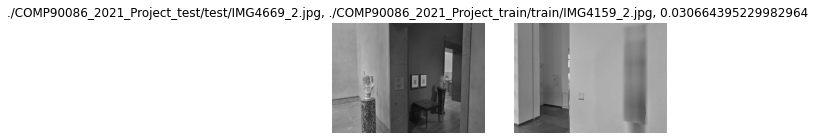

 18%|█▊        | 217/1200 [53:26<3:25:23, 12.54s/it]

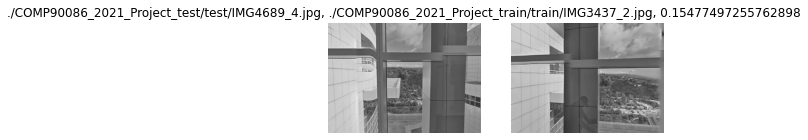

 18%|█▊        | 218/1200 [53:36<3:15:54, 11.97s/it]

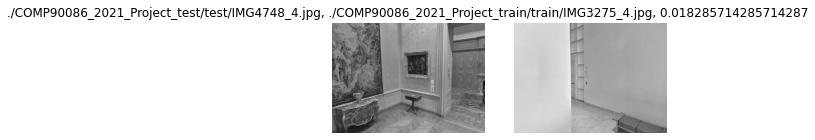

 18%|█▊        | 219/1200 [53:48<3:15:21, 11.95s/it]

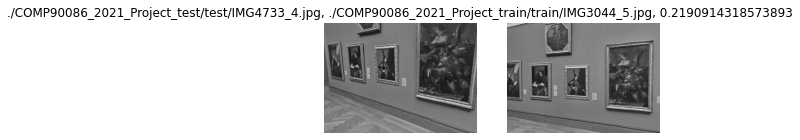

 18%|█▊        | 220/1200 [54:04<3:35:55, 13.22s/it]

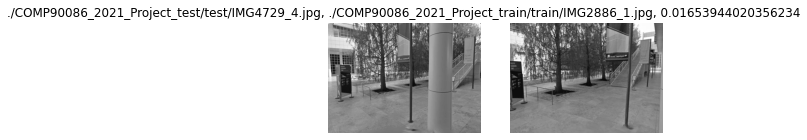

 18%|█▊        | 221/1200 [54:40<5:25:01, 19.92s/it]

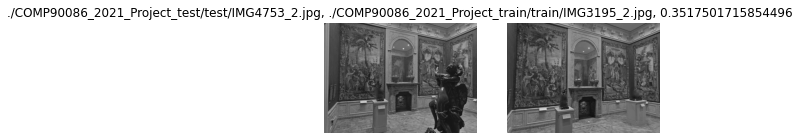

 18%|█▊        | 222/1200 [55:16<6:45:15, 24.86s/it]

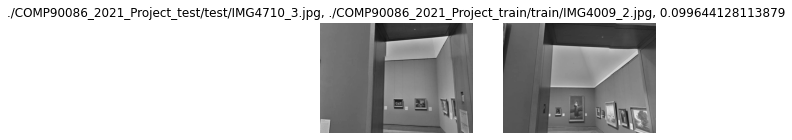

 19%|█▊        | 223/1200 [55:27<5:32:41, 20.43s/it]

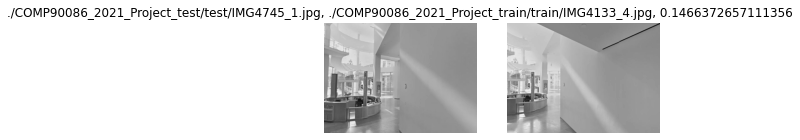

 19%|█▊        | 224/1200 [55:37<4:41:46, 17.32s/it]

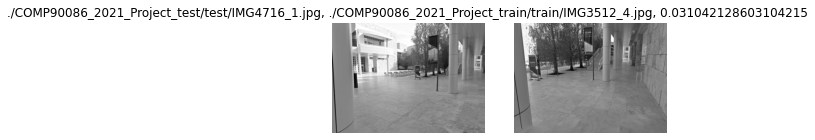

 19%|█▉        | 225/1200 [55:50<4:22:09, 16.13s/it]

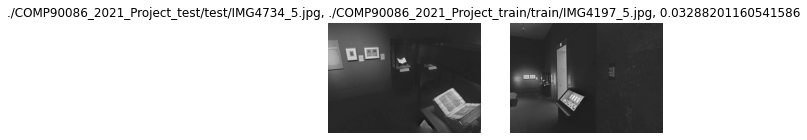

 19%|█▉        | 226/1200 [55:59<3:48:39, 14.09s/it]

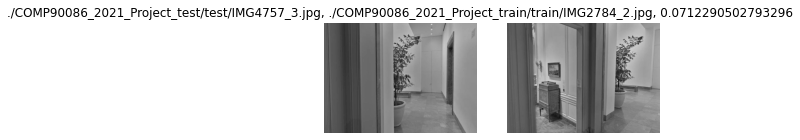

 19%|█▉        | 227/1200 [56:09<3:28:04, 12.83s/it]

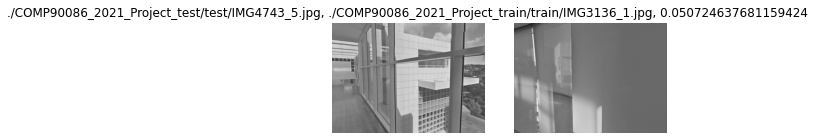

 19%|█▉        | 228/1200 [56:20<3:17:18, 12.18s/it]

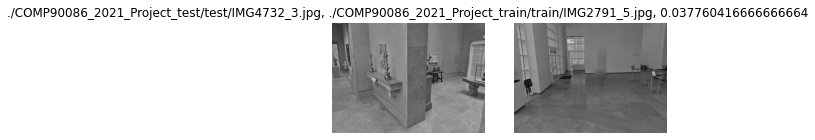

 19%|█▉        | 229/1200 [56:31<3:10:30, 11.77s/it]

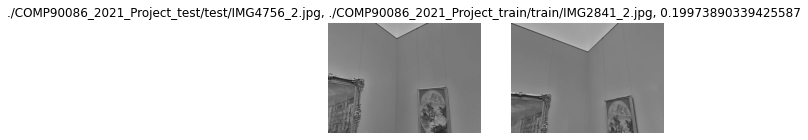

 19%|█▉        | 230/1200 [56:41<3:02:55, 11.32s/it]

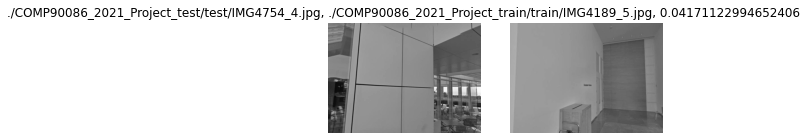

 19%|█▉        | 231/1200 [56:51<2:57:06, 10.97s/it]

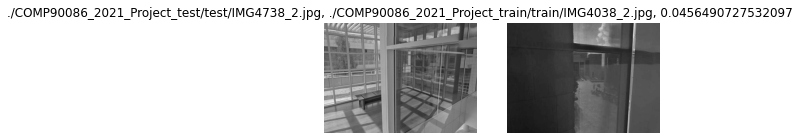

 19%|█▉        | 232/1200 [57:03<3:02:11, 11.29s/it]

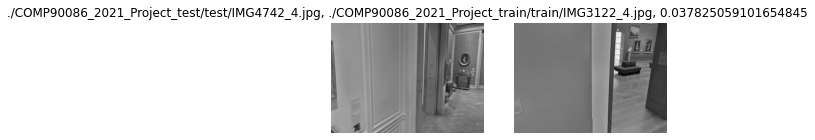

 19%|█▉        | 233/1200 [57:13<2:53:12, 10.75s/it]

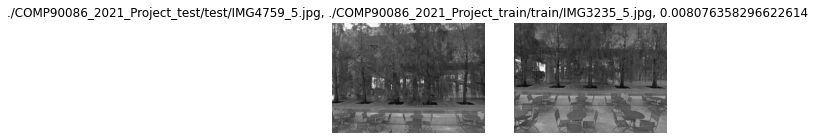

 20%|█▉        | 234/1200 [57:35<3:48:02, 14.16s/it]

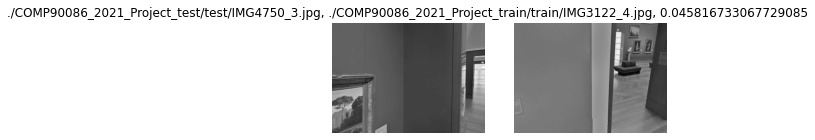

 20%|█▉        | 235/1200 [57:44<3:24:35, 12.72s/it]

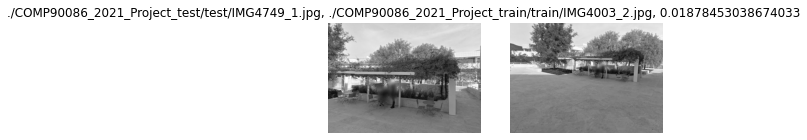

 20%|█▉        | 236/1200 [58:15<4:52:40, 18.22s/it]

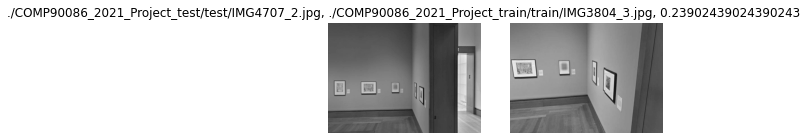

 20%|█▉        | 237/1200 [58:25<4:11:16, 15.66s/it]

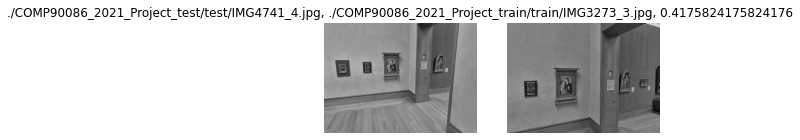

 20%|█▉        | 238/1200 [58:35<3:44:58, 14.03s/it]

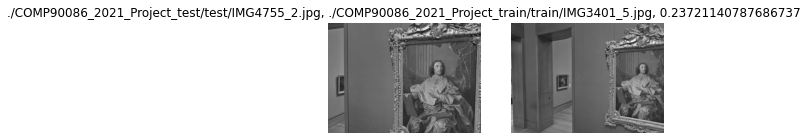

 20%|█▉        | 239/1200 [58:57<4:24:08, 16.49s/it]

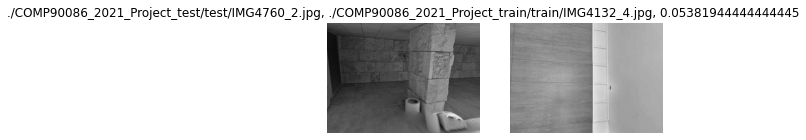

 20%|██        | 240/1200 [59:08<3:54:44, 14.67s/it]

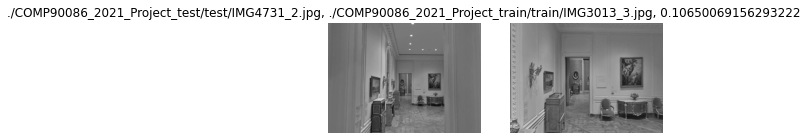

 20%|██        | 241/1200 [59:18<3:35:18, 13.47s/it]

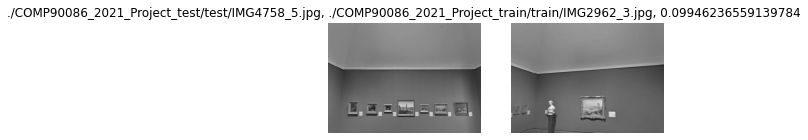

 20%|██        | 242/1200 [59:28<3:15:36, 12.25s/it]

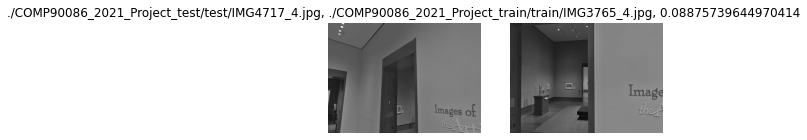

 20%|██        | 243/1200 [59:37<3:00:50, 11.34s/it]

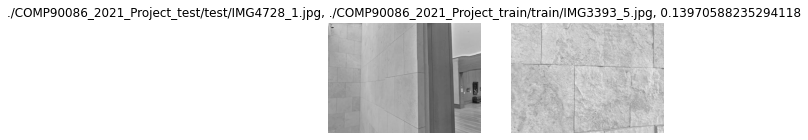

 20%|██        | 244/1200 [59:46<2:51:10, 10.74s/it]

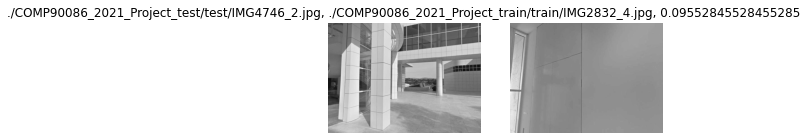

 20%|██        | 245/1200 [59:57<2:48:46, 10.60s/it]

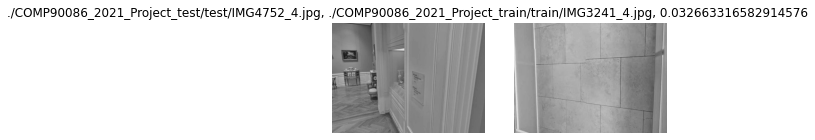

 20%|██        | 246/1200 [1:00:06<2:44:19, 10.33s/it]

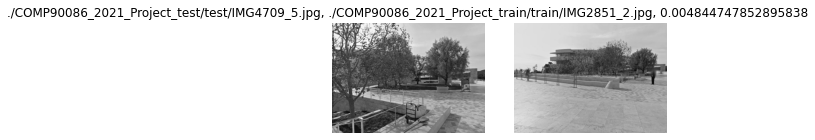

 21%|██        | 247/1200 [1:01:02<6:22:31, 24.08s/it]

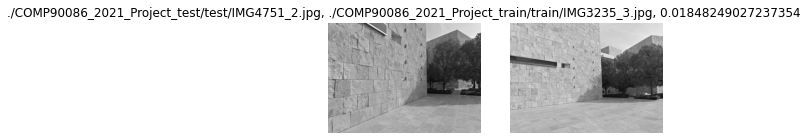

 21%|██        | 248/1200 [1:01:22<6:00:14, 22.70s/it]

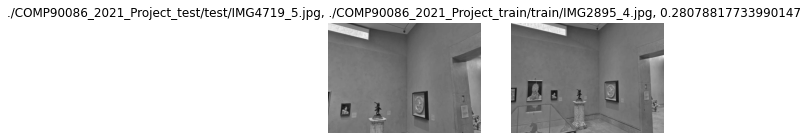

 21%|██        | 249/1200 [1:01:32<5:00:21, 18.95s/it]

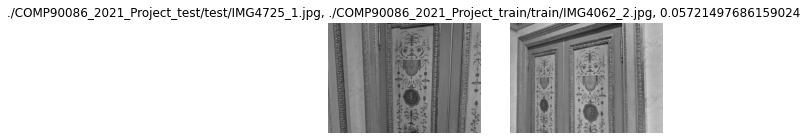

 21%|██        | 250/1200 [1:01:54<5:14:27, 19.86s/it]

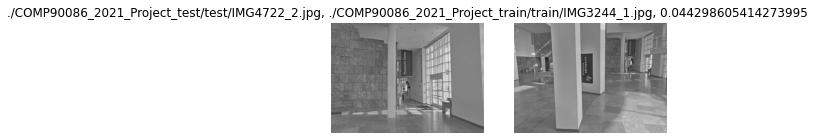

 21%|██        | 251/1200 [1:02:07<4:38:41, 17.62s/it]

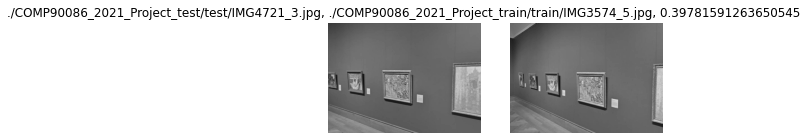

 21%|██        | 252/1200 [1:02:17<4:06:52, 15.62s/it]

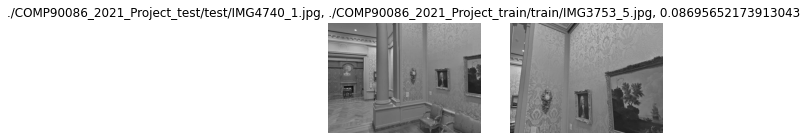

 21%|██        | 253/1200 [1:02:28<3:43:59, 14.19s/it]

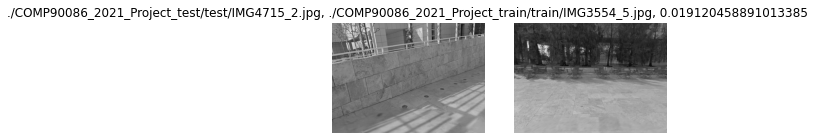

 21%|██        | 254/1200 [1:02:40<3:33:43, 13.56s/it]

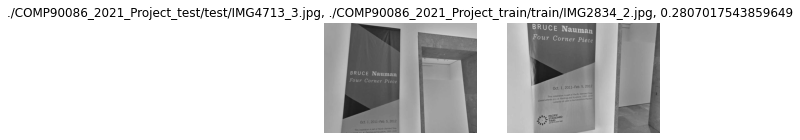

 21%|██▏       | 255/1200 [1:02:50<3:12:37, 12.23s/it]

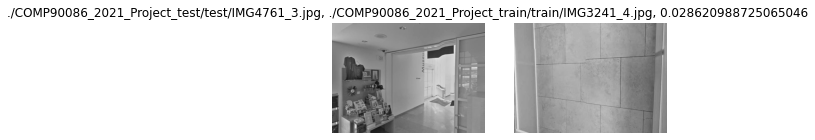

 21%|██▏       | 256/1200 [1:03:00<3:05:12, 11.77s/it]

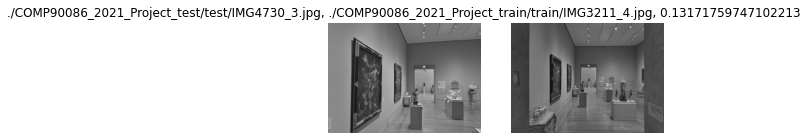

 21%|██▏       | 257/1200 [1:03:12<3:04:18, 11.73s/it]

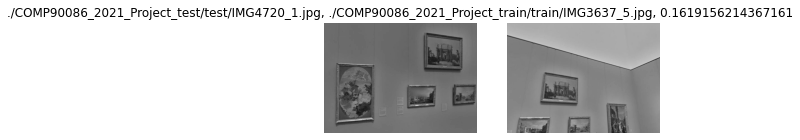

 22%|██▏       | 258/1200 [1:03:24<3:05:35, 11.82s/it]

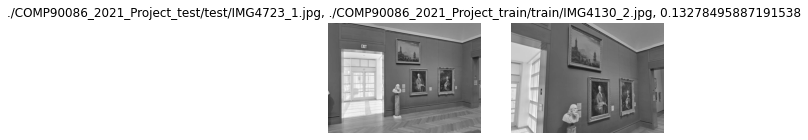

 22%|██▏       | 259/1200 [1:03:36<3:06:51, 11.91s/it]

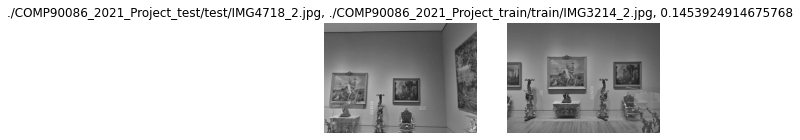

 22%|██▏       | 260/1200 [1:03:51<3:19:20, 12.72s/it]

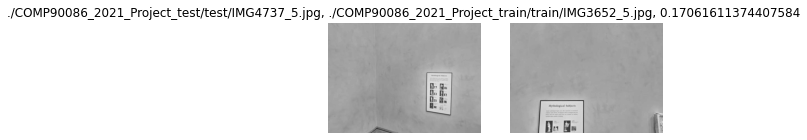

 22%|██▏       | 261/1200 [1:04:00<3:01:54, 11.62s/it]

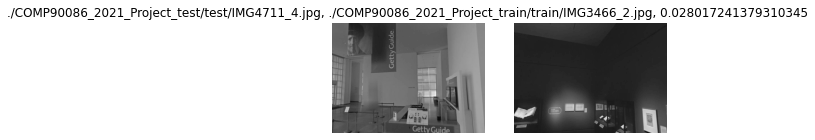

 22%|██▏       | 262/1200 [1:04:10<2:54:49, 11.18s/it]

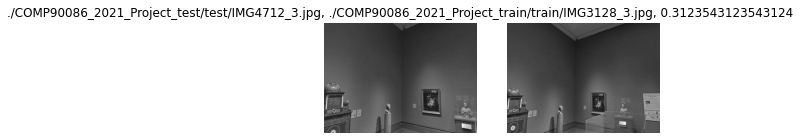

 22%|██▏       | 263/1200 [1:04:20<2:50:41, 10.93s/it]

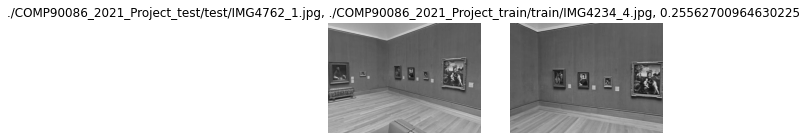

 22%|██▏       | 264/1200 [1:04:31<2:50:49, 10.95s/it]

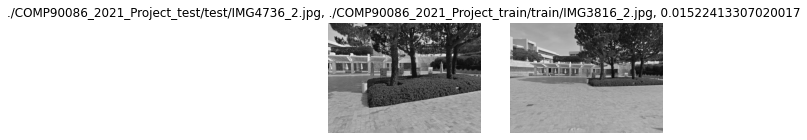

 22%|██▏       | 265/1200 [1:04:56<3:55:40, 15.12s/it]

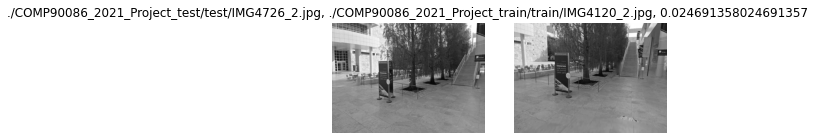

 22%|██▏       | 266/1200 [1:05:27<5:08:22, 19.81s/it]

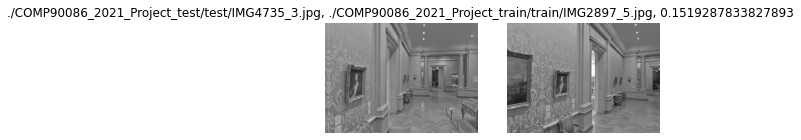

 22%|██▏       | 267/1200 [1:05:39<4:30:37, 17.40s/it]

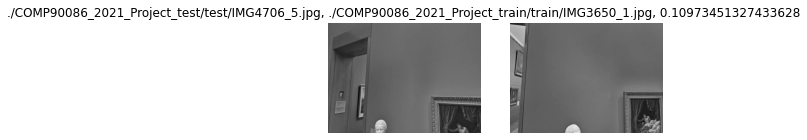

 22%|██▏       | 268/1200 [1:05:49<3:55:26, 15.16s/it]

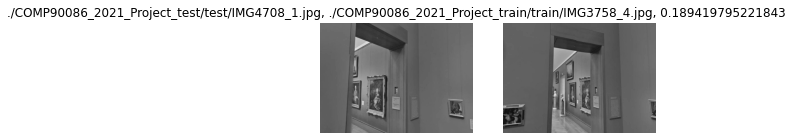

 22%|██▏       | 269/1200 [1:05:59<3:33:28, 13.76s/it]

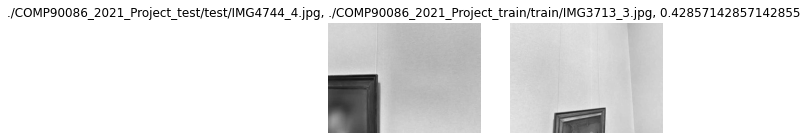

 22%|██▎       | 270/1200 [1:06:08<3:09:28, 12.22s/it]

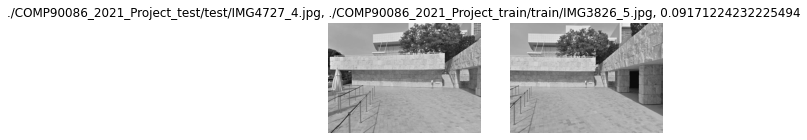

 23%|██▎       | 271/1200 [1:06:28<3:45:24, 14.56s/it]

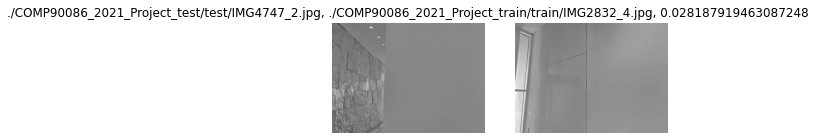

 23%|██▎       | 272/1200 [1:06:37<3:21:49, 13.05s/it]

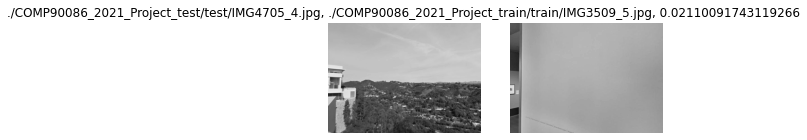

 23%|██▎       | 273/1200 [1:06:52<3:30:32, 13.63s/it]

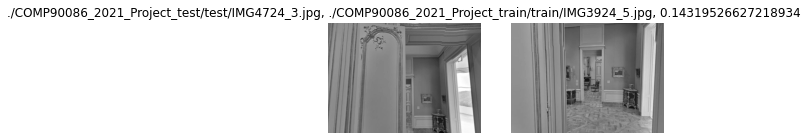

 23%|██▎       | 274/1200 [1:07:03<3:18:01, 12.83s/it]

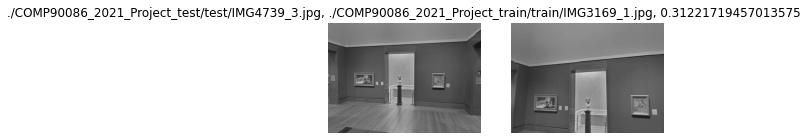

 23%|██▎       | 275/1200 [1:07:13<3:05:26, 12.03s/it]

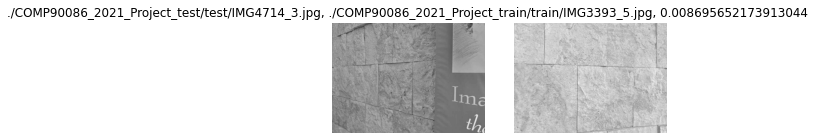

 23%|██▎       | 276/1200 [1:07:23<2:54:57, 11.36s/it]

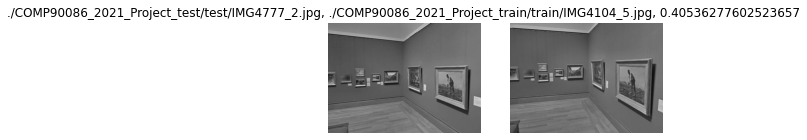

 23%|██▎       | 277/1200 [1:07:34<2:52:38, 11.22s/it]

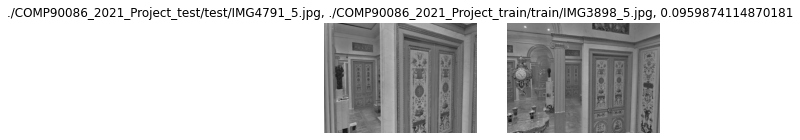

 23%|██▎       | 278/1200 [1:07:48<3:06:06, 12.11s/it]

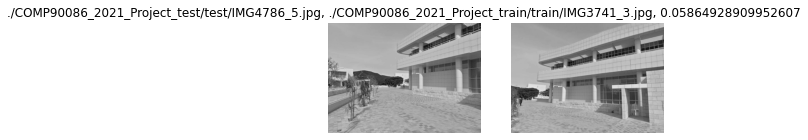

 23%|██▎       | 279/1200 [1:08:08<3:40:53, 14.39s/it]

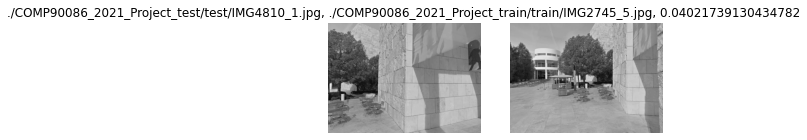

 23%|██▎       | 280/1200 [1:08:22<3:38:13, 14.23s/it]

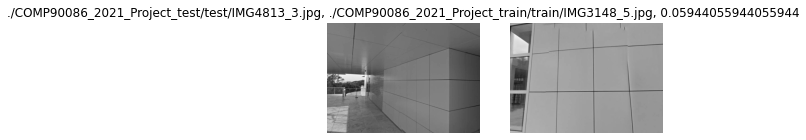

 23%|██▎       | 281/1200 [1:08:31<3:16:38, 12.84s/it]

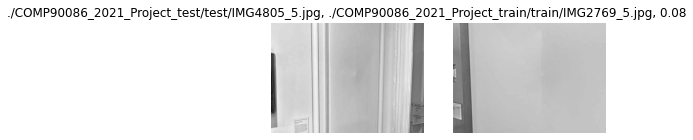

 24%|██▎       | 282/1200 [1:08:40<2:57:12, 11.58s/it]

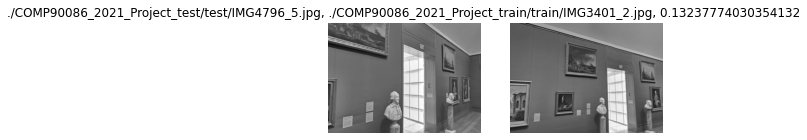

 24%|██▎       | 283/1200 [1:08:53<3:01:24, 11.87s/it]

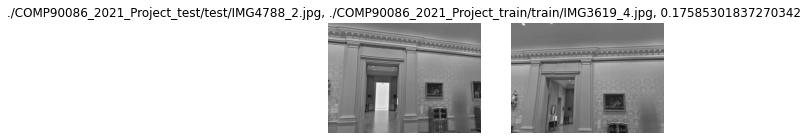

 24%|██▎       | 284/1200 [1:09:06<3:07:52, 12.31s/it]

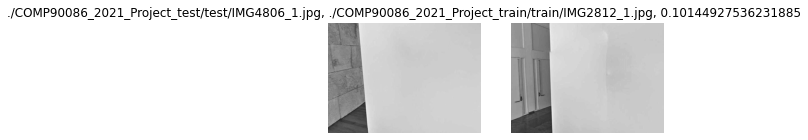

 24%|██▍       | 285/1200 [1:09:15<2:51:19, 11.23s/it]

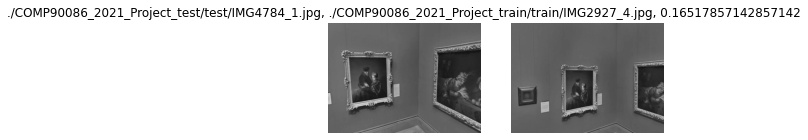

 24%|██▍       | 286/1200 [1:09:29<3:07:53, 12.33s/it]

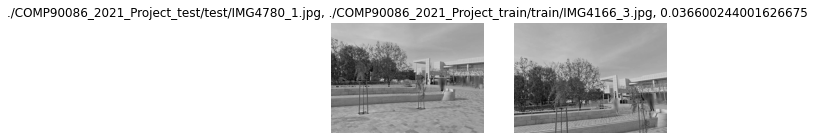

 24%|██▍       | 287/1200 [1:09:56<4:12:43, 16.61s/it]

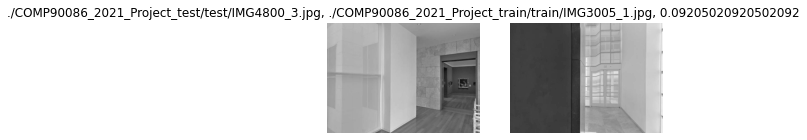

 24%|██▍       | 288/1200 [1:10:05<3:39:35, 14.45s/it]

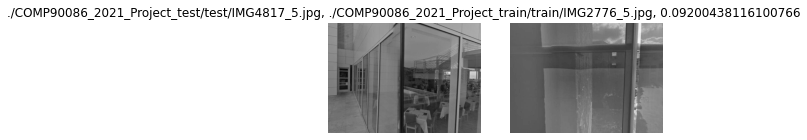

 24%|██▍       | 289/1200 [1:10:15<3:18:22, 13.06s/it]

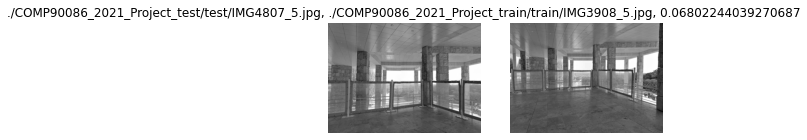

 24%|██▍       | 290/1200 [1:10:29<3:21:00, 13.25s/it]

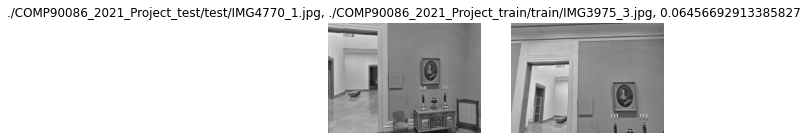

 24%|██▍       | 291/1200 [1:10:42<3:21:42, 13.31s/it]

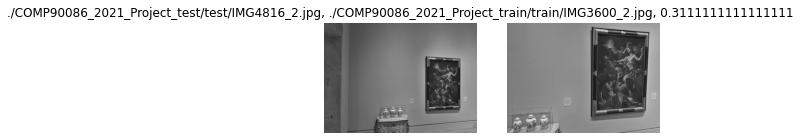

 24%|██▍       | 292/1200 [1:10:54<3:13:18, 12.77s/it]

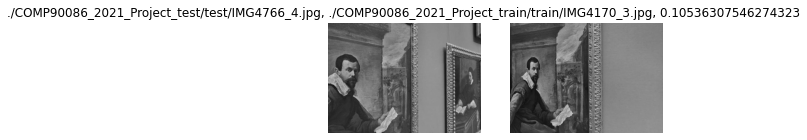

 24%|██▍       | 293/1200 [1:11:09<3:22:43, 13.41s/it]

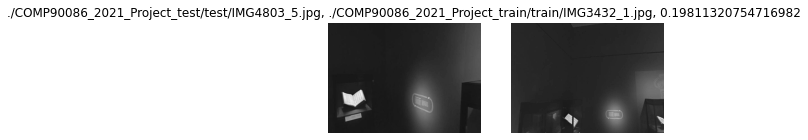

 24%|██▍       | 294/1200 [1:11:17<3:00:21, 11.94s/it]

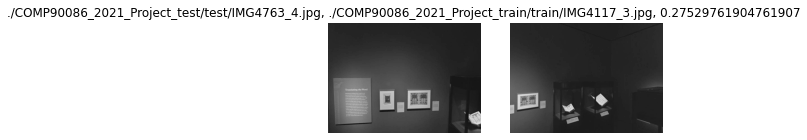

 25%|██▍       | 295/1200 [1:11:27<2:50:48, 11.32s/it]

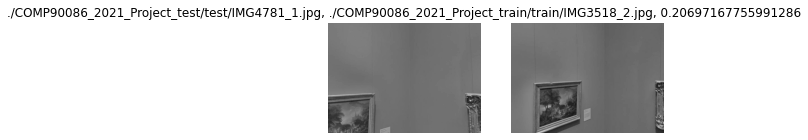

 25%|██▍       | 296/1200 [1:11:37<2:41:36, 10.73s/it]

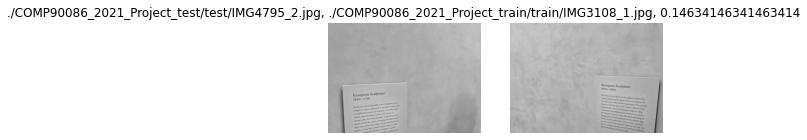

 25%|██▍       | 297/1200 [1:11:45<2:32:24, 10.13s/it]

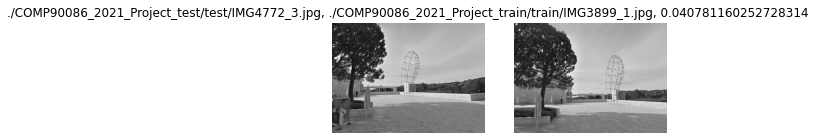

 25%|██▍       | 298/1200 [1:12:12<3:48:26, 15.20s/it]

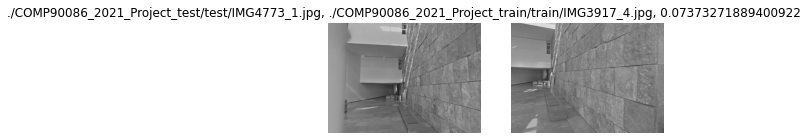

 25%|██▍       | 299/1200 [1:12:24<3:30:41, 14.03s/it]

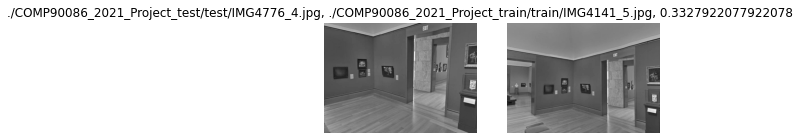

 25%|██▌       | 300/1200 [1:12:35<3:17:35, 13.17s/it]

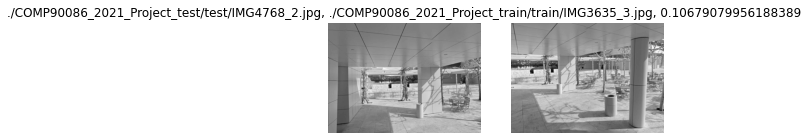

 25%|██▌       | 301/1200 [1:12:47<3:12:46, 12.87s/it]

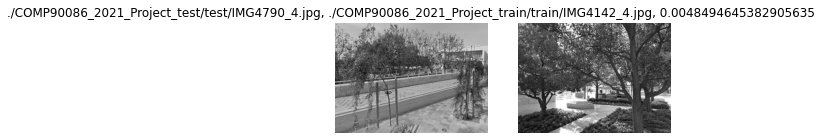

 25%|██▌       | 302/1200 [1:13:52<7:05:25, 28.43s/it]

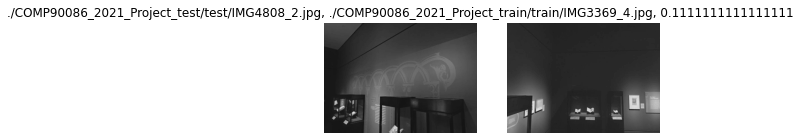

 25%|██▌       | 303/1200 [1:14:01<5:40:06, 22.75s/it]

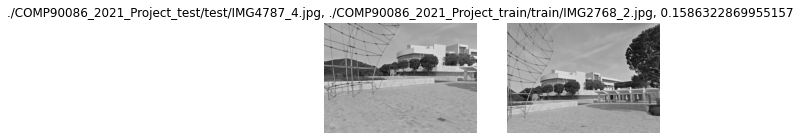

 25%|██▌       | 304/1200 [1:14:18<5:12:50, 20.95s/it]

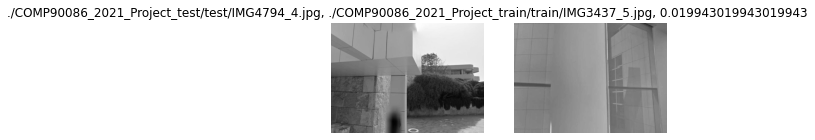

 25%|██▌       | 305/1200 [1:14:31<4:38:56, 18.70s/it]

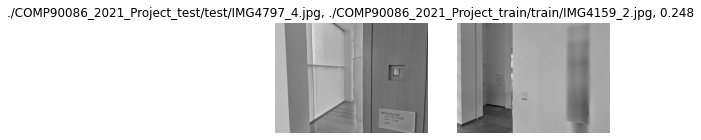

 26%|██▌       | 306/1200 [1:14:41<3:56:47, 15.89s/it]

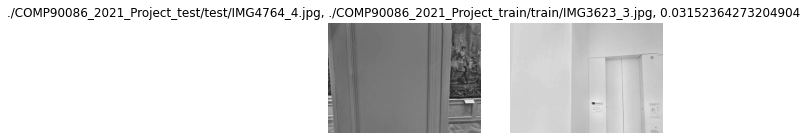

 26%|██▌       | 307/1200 [1:14:50<3:26:42, 13.89s/it]

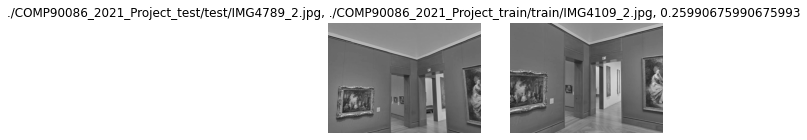

 26%|██▌       | 308/1200 [1:15:02<3:17:12, 13.26s/it]

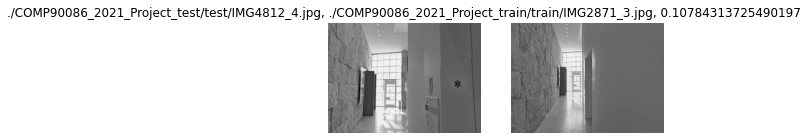

 26%|██▌       | 309/1200 [1:15:12<3:02:39, 12.30s/it]

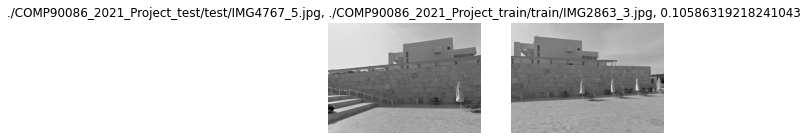

 26%|██▌       | 310/1200 [1:15:23<2:59:33, 12.10s/it]

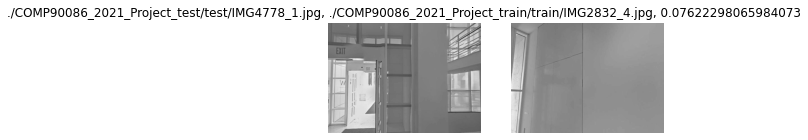

 26%|██▌       | 311/1200 [1:15:34<2:53:09, 11.69s/it]

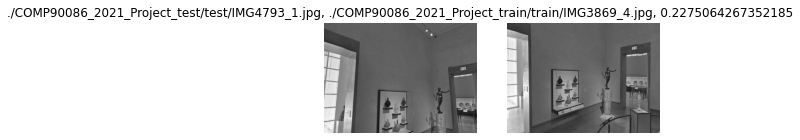

 26%|██▌       | 312/1200 [1:15:45<2:49:52, 11.48s/it]

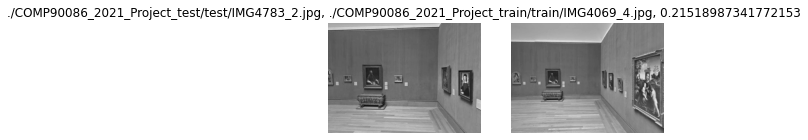

 26%|██▌       | 313/1200 [1:15:57<2:50:08, 11.51s/it]

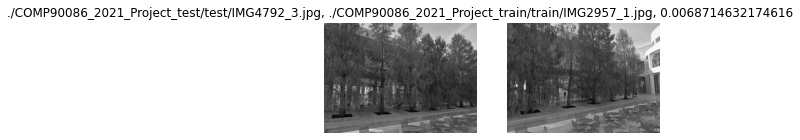

 26%|██▌       | 314/1200 [1:16:27<4:11:18, 17.02s/it]

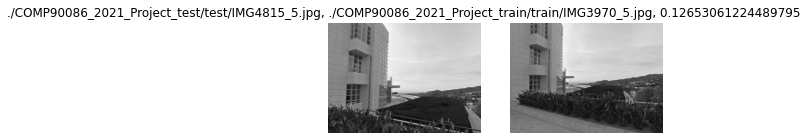

 26%|██▋       | 315/1200 [1:16:41<3:59:28, 16.24s/it]

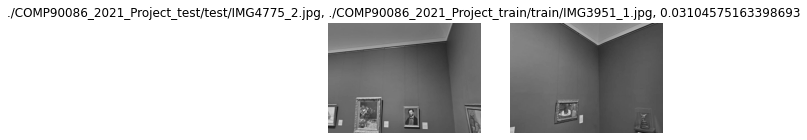

 26%|██▋       | 316/1200 [1:16:52<3:34:01, 14.53s/it]

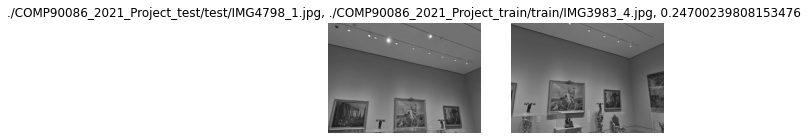

 26%|██▋       | 317/1200 [1:17:03<3:20:38, 13.63s/it]

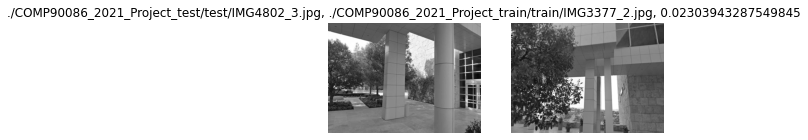

 26%|██▋       | 318/1200 [1:17:23<3:49:21, 15.60s/it]

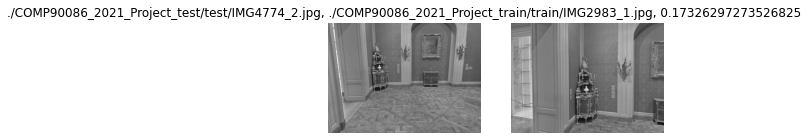

 27%|██▋       | 319/1200 [1:17:36<3:36:21, 14.73s/it]

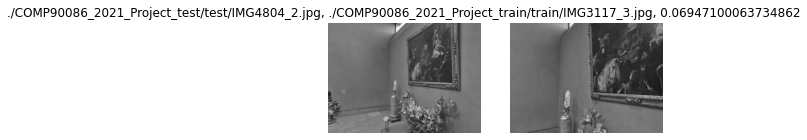

 27%|██▋       | 320/1200 [1:17:52<3:42:33, 15.17s/it]

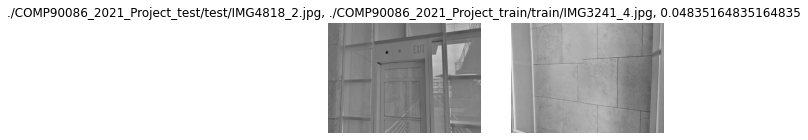

 27%|██▋       | 321/1200 [1:18:02<3:20:10, 13.66s/it]

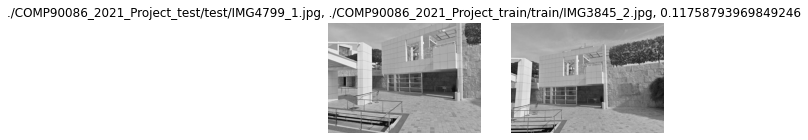

 27%|██▋       | 322/1200 [1:18:23<3:49:00, 15.65s/it]

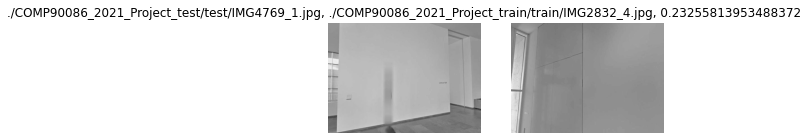

 27%|██▋       | 323/1200 [1:18:32<3:19:15, 13.63s/it]

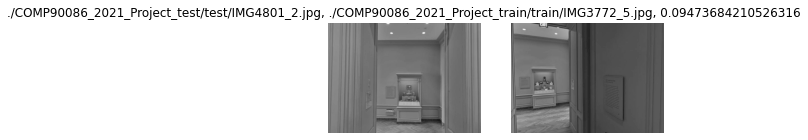

 27%|██▋       | 324/1200 [1:18:41<3:01:12, 12.41s/it]

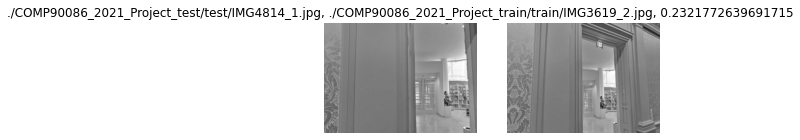

 27%|██▋       | 325/1200 [1:18:52<2:52:01, 11.80s/it]

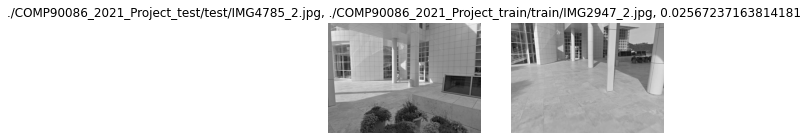

 27%|██▋       | 326/1200 [1:19:07<3:06:01, 12.77s/it]

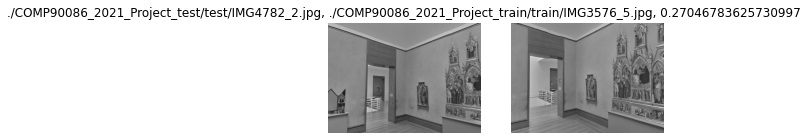

 27%|██▋       | 327/1200 [1:19:21<3:13:30, 13.30s/it]

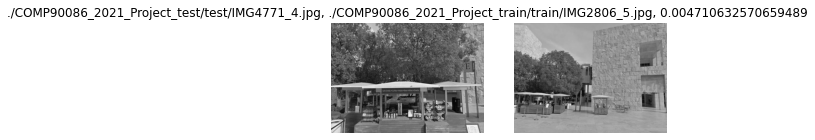

 27%|██▋       | 328/1200 [1:19:47<4:09:48, 17.19s/it]

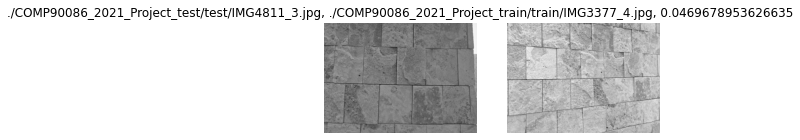

 27%|██▋       | 329/1200 [1:20:06<4:15:08, 17.58s/it]

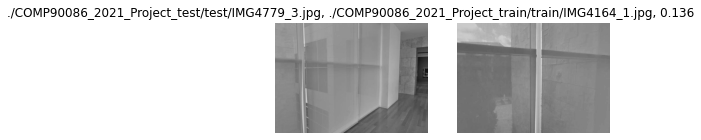

 28%|██▊       | 330/1200 [1:20:15<3:38:10, 15.05s/it]

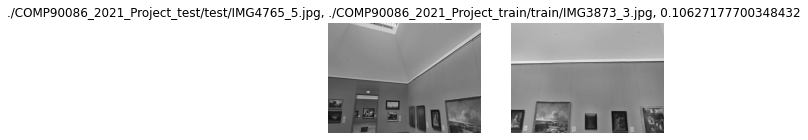

 28%|██▊       | 331/1200 [1:20:26<3:19:31, 13.78s/it]

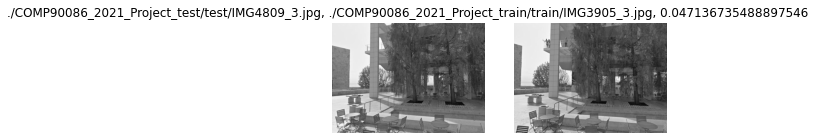

 28%|██▊       | 332/1200 [1:21:02<4:58:21, 20.62s/it]

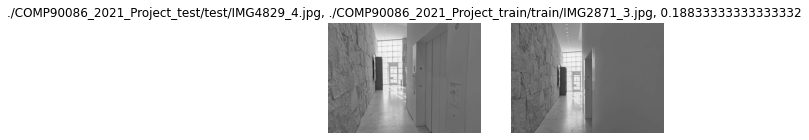

 28%|██▊       | 333/1200 [1:21:12<4:10:59, 17.37s/it]

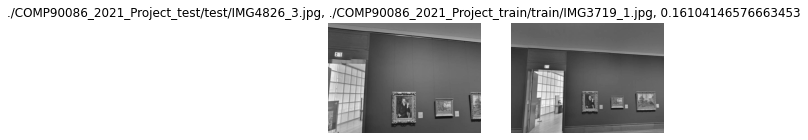

 28%|██▊       | 334/1200 [1:21:24<3:47:40, 15.77s/it]

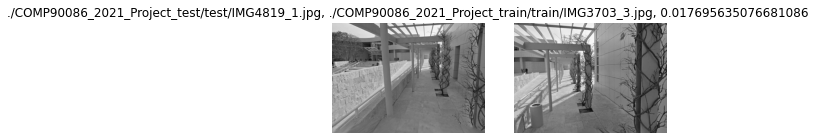

 28%|██▊       | 335/1200 [1:21:40<3:47:27, 15.78s/it]

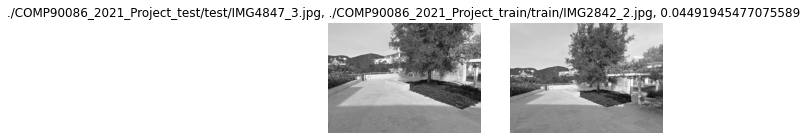

 28%|██▊       | 336/1200 [1:22:14<5:07:30, 21.35s/it]

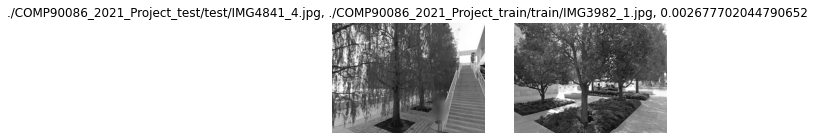

 28%|██▊       | 337/1200 [1:23:06<7:17:01, 30.38s/it]

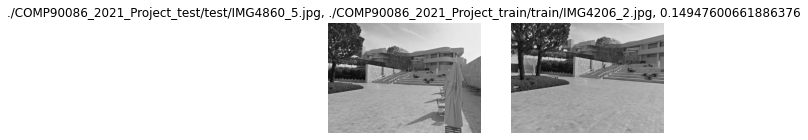

 28%|██▊       | 338/1200 [1:23:20<6:07:41, 25.59s/it]

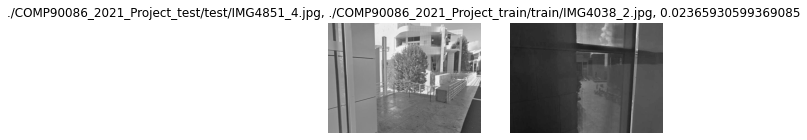

 28%|██▊       | 339/1200 [1:23:33<5:13:58, 21.88s/it]

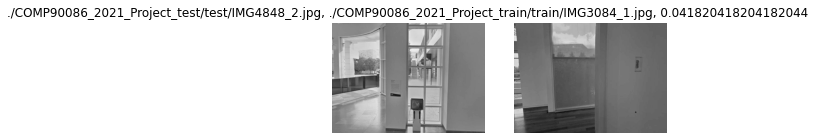

 28%|██▊       | 340/1200 [1:23:44<4:26:04, 18.56s/it]

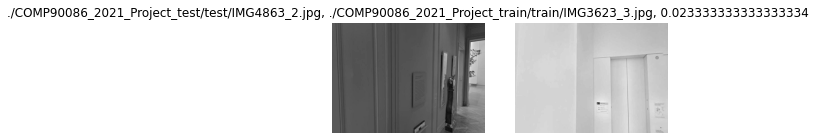

 28%|██▊       | 341/1200 [1:23:53<3:44:49, 15.70s/it]

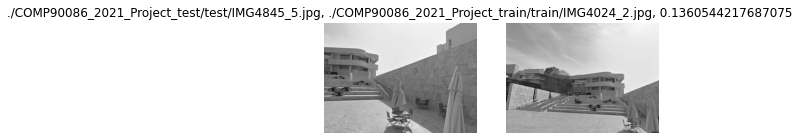

 28%|██▊       | 342/1200 [1:24:08<3:39:12, 15.33s/it]

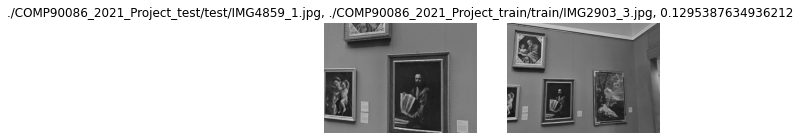

 29%|██▊       | 343/1200 [1:24:20<3:26:46, 14.48s/it]

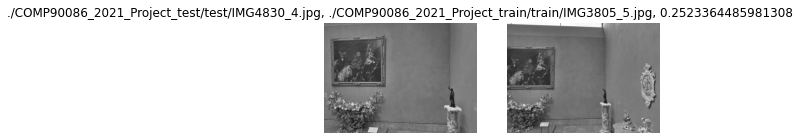

 29%|██▊       | 344/1200 [1:24:36<3:33:53, 14.99s/it]

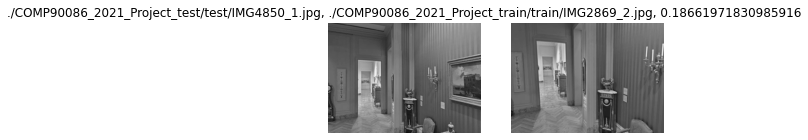

 29%|██▉       | 345/1200 [1:24:49<3:22:41, 14.22s/it]

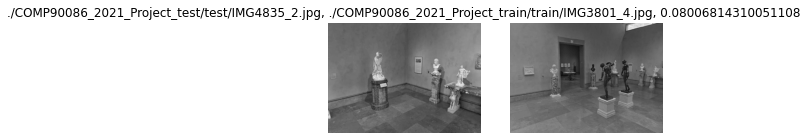

 29%|██▉       | 346/1200 [1:25:00<3:07:14, 13.15s/it]

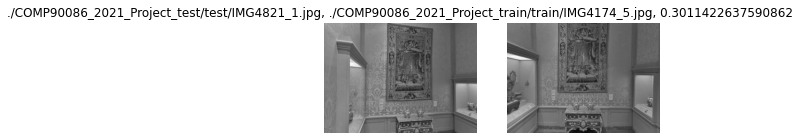

 29%|██▉       | 347/1200 [1:25:11<3:00:06, 12.67s/it]

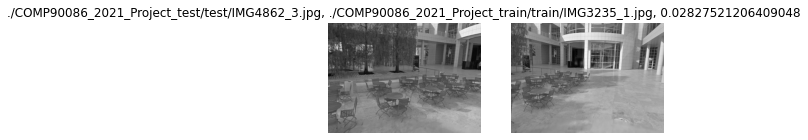

 29%|██▉       | 348/1200 [1:25:35<3:48:45, 16.11s/it]

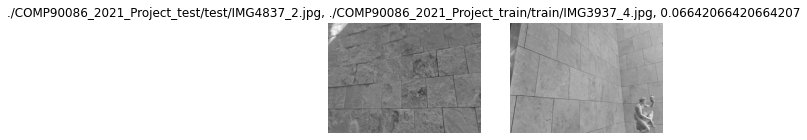

 29%|██▉       | 349/1200 [1:25:50<3:41:04, 15.59s/it]

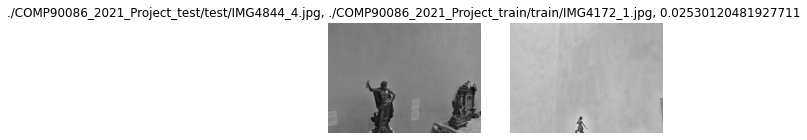

 29%|██▉       | 350/1200 [1:26:00<3:19:03, 14.05s/it]

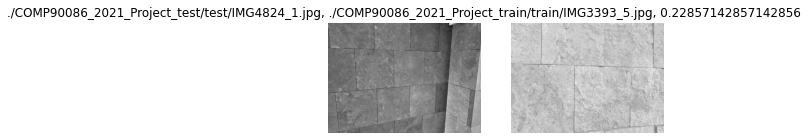

 29%|██▉       | 351/1200 [1:26:10<2:59:46, 12.71s/it]

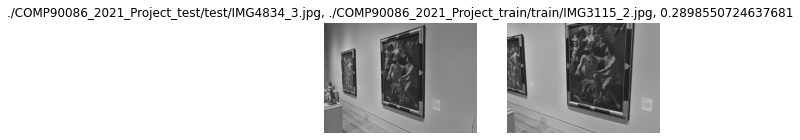

 29%|██▉       | 352/1200 [1:26:22<2:57:06, 12.53s/it]

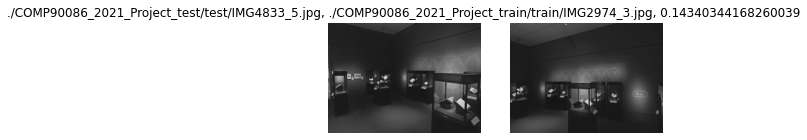

 29%|██▉       | 353/1200 [1:26:32<2:45:17, 11.71s/it]

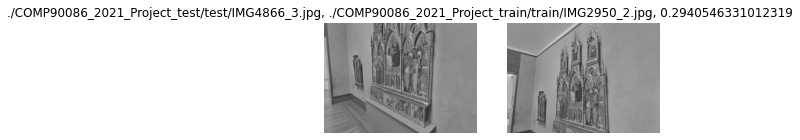

 30%|██▉       | 354/1200 [1:26:48<3:03:28, 13.01s/it]

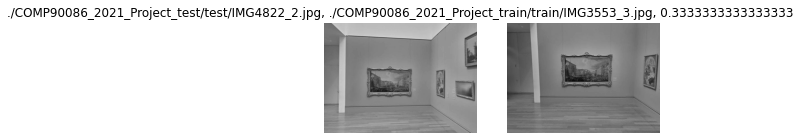

 30%|██▉       | 355/1200 [1:26:59<2:55:35, 12.47s/it]

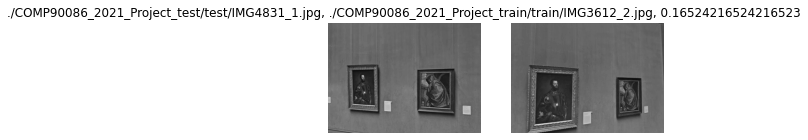

 30%|██▉       | 356/1200 [1:27:11<2:52:14, 12.25s/it]

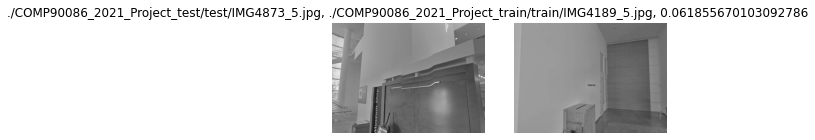

 30%|██▉       | 357/1200 [1:27:20<2:42:28, 11.56s/it]

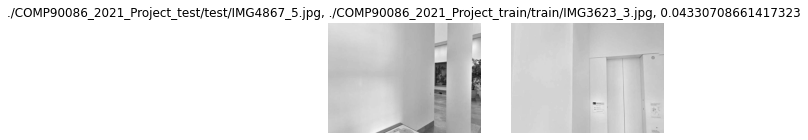

 30%|██▉       | 358/1200 [1:27:30<2:33:10, 10.91s/it]

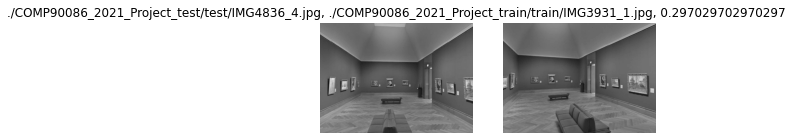

 30%|██▉       | 359/1200 [1:27:41<2:33:25, 10.95s/it]

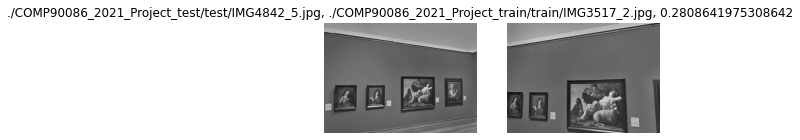

 30%|███       | 360/1200 [1:27:53<2:36:04, 11.15s/it]

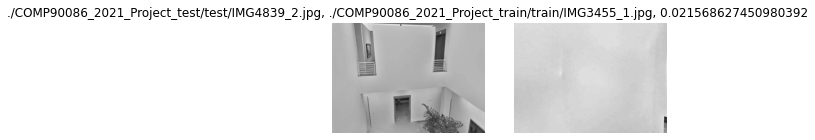

 30%|███       | 361/1200 [1:28:02<2:28:13, 10.60s/it]

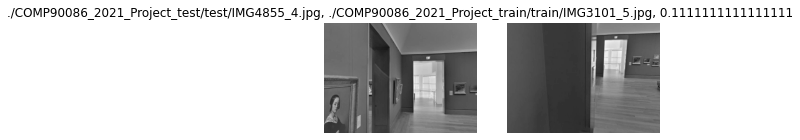

 30%|███       | 362/1200 [1:28:13<2:29:55, 10.73s/it]

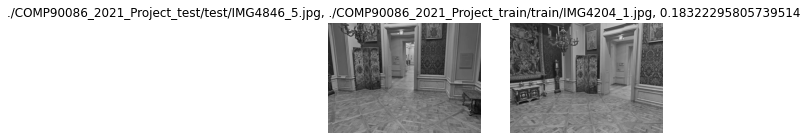

 30%|███       | 363/1200 [1:28:29<2:53:39, 12.45s/it]

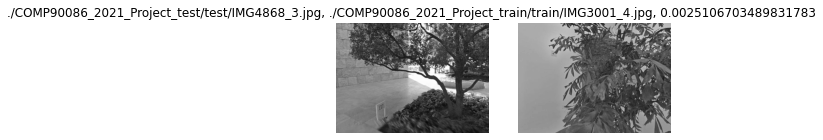

 30%|███       | 364/1200 [1:28:50<3:28:03, 14.93s/it]

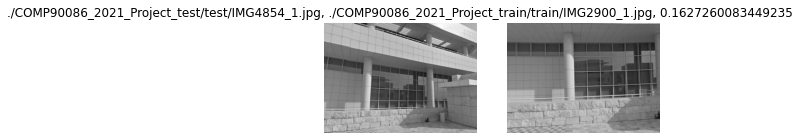

 30%|███       | 365/1200 [1:29:04<3:23:18, 14.61s/it]

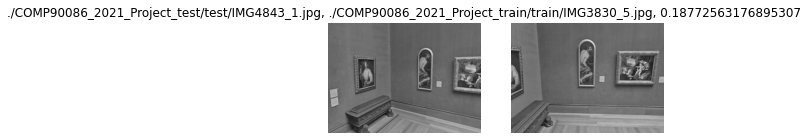

 30%|███       | 366/1200 [1:29:18<3:18:49, 14.30s/it]

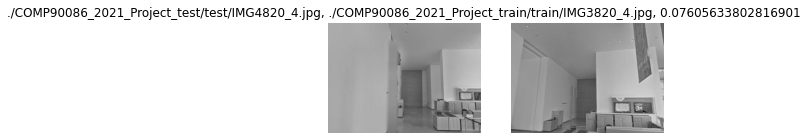

 31%|███       | 367/1200 [1:29:27<2:57:49, 12.81s/it]

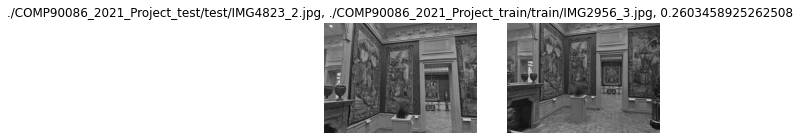

 31%|███       | 368/1200 [1:29:47<3:27:30, 14.96s/it]

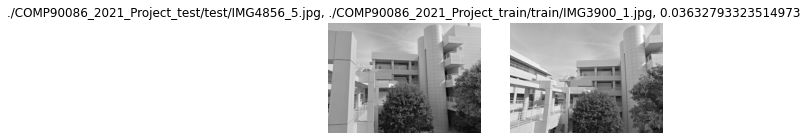

 31%|███       | 369/1200 [1:30:08<3:51:44, 16.73s/it]

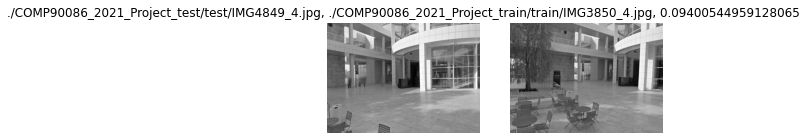

 31%|███       | 370/1200 [1:30:20<3:34:20, 15.49s/it]

In [ ]:
# Use ResNet to find the top 50 closetst picture first and then apply SIFt to find the final result
# Ref: https://www.oreilly.com/library/view/practical-deep-learning/9781492034858/ch04.html

from sklearn.neighbors import NearestNeighbors

data=open("./ResNet_Result.txt",'w+') 
predictions_csv_name="./ResNet50_1_Pred.csv"
# csv_header= ["Id", "x", "y"]

# ToDo: Check every pictures in Test
for current_test_image in tqdm(test_dir_list):
  if re.match(r'(.*?jpg)', current_test_image) is not None:

    # Step 1: Use ResNet to Extract Features
    full_current_test_dir = test_folder_dir + current_test_image
    current_test_image_gs = cv2.imread(full_current_test_dir, cv2.IMREAD_GRAYSCALE)    
    img = image.load_img(full_current_test_dir, target_size=(112, 112))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = preprocess_input(img)
    current_test_fea = fea_model.predict(img)

    # Step 2: Use K NearestNeighbors to find top 50 similar images
    size_1, size_x, size_y, channel_num = current_test_fea.shape
    current_test_fea_1d=current_test_fea.reshape((size_1*size_x*size_y*channel_num))
    neighbors = NearestNeighbors(n_neighbors=50, algorithm='brute', metric='euclidean').fit(train_fea_matrix_1d)
    distances, top_50_indices = neighbors.kneighbors([current_test_fea_1d])

    # Step 3: Find the nearest image in top 50 by SIFT RANSAC
    sift_match_score = 0
    for each_index in top_50_indices[0]:
      current_sift_ransac_score=sift_ransac_score(full_current_test_dir, train_folder_dir+train_image_name[each_index])
      if current_sift_ransac_score > sift_match_score:
        sift_match_score = current_sift_ransac_score
        best_match_image = train_image_name[each_index]
            
    sift_matched_image = cv2.imread(train_folder_dir+best_match_image, cv2.IMREAD_GRAYSCALE)

    plt.subplot(1,2,1)
    plt.title(full_current_test_dir+', '+train_folder_dir+best_match_image+', '+str(sift_match_score))
    plt.imshow(current_test_image_gs, cmap='gray') 
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.imshow(sift_matched_image, cmap='gray') 
    plt.axis('off')
    plt.show()

    print("======================================================================", file=data)

    print(full_current_test_dir+', '+ train_folder_dir + best_match_image+', '+str(sift_match_score), file=data)

    print("======================================================================", file=data)
    
    current_train_x=0
    current_train_y=0
    is_train_image_pos_found = False
    
    # CSV Read
    
    with open('./COMP90086_2021_Project_train/train.csv','r') as f_train:
        data_train = csv.reader(f_train)
        for each_row in data_train:
            if re.match(each_row[0].upper(),best_match_image.upper()) is not None:
                current_train_x=each_row[1]
                current_train_y=each_row[2]
                is_train_image_pos_found = True
        if not is_train_image_pos_found:
            print(best_match_image[0:9]+" Train Image Position NOT Found!")
    
    # CSV Write
    
    newPred = [current_test_image[0:9].upper(), current_train_x, current_train_y]
    #data_csv.writerow(newPred)
    
    
    with open(predictions_csv_name, "a",newline="") as f_csv:
        data_csv = csv.writer(f_csv)
        data_csv.writerow(newPred)
    

#f_csv.close()           
data.close()

In [ ]:
# Use pHash to find the top 50 closetst picture first and then apply SIFt to find the final result

import os
import re
import csv
from tqdm import tqdm

data=open("./phash_IMG5041_1_To_IMG5257_1.txt",'w+') 
predictions_csv_name="./IMG5041_1_To_IMG5257_1_Pred.csv"
# csv_header= ["Id", "x", "y"]

# CSV Write
#f_csv=open(predictions_csv_name, "a")
#data_csv = csv.writer(f_csv)

train_folder_dir = './COMP90086_2021_Project_train/train/'
train_dir_list = os.listdir(train_folder_dir)
test_folder_dir = './COMP90086_2021_Project_test/test/'
test_dir_list = os.listdir(test_folder_dir)

# ToDo: Check every pictures in Test
for current_test_image in tqdm(test_dir_list):
  if re.match(r'(.*?jpg)', current_test_image) is not None:
    full_current_test_dir = test_folder_dir + current_test_image
    current_test_image_gs = cv2.imread(full_current_test_dir, cv2.IMREAD_GRAYSCALE)
    test_hash = pHash(full_current_test_dir)
    sift_match_score = 0

    current_train_image_list_dict=dict()

    #current_train_image_list = []
    #current_ham_dist_list = []
    for current_train_image in train_dir_list:
      if re.match(r'(.*?jpg)', current_train_image) is not None:
        full_current_train_dir = train_folder_dir + current_train_image
        train_hash = pHash(full_current_train_dir)
        current_ham_dist = Hamming_distance(test_hash,train_hash)
        
        print(current_test_image+', '+current_train_image+', '+str(current_ham_dist), file=data)
        
        #ToDo: find the top 50 closest hash distance
        if current_ham_dist > 0.7:
          current_train_image_list_dict[current_train_image]=current_ham_dist
          #current_train_image_list.append(full_current_train_dir)
          #current_ham_dist_list.append(current_ham_dist)
    #current_top_50_dist_list = Nmaxelements(current_ham_dist_list, 50)

    current_top_50_dist_dict = Nmax_dict_elements(current_train_image_list_dict, 50)
    '''
    current_top_50_train_image_list =[]
    for each_ham_dist in current_top_50_dist_list:
      current_top_50_train_image_list.append(current_train_image_list[current_ham_dist_list.index(each_ham_dist)])
    for each_top_50 in current_top_50_train_image_list:
    '''
    for each_key in current_top_50_dist_dict:
      current_sift_ransac_score=sift_ransac_score(full_current_test_dir, train_folder_dir+each_key)
      if current_sift_ransac_score > sift_match_score:
        sift_match_score = current_sift_ransac_score
        best_match_image = each_key
            
    sift_matched_image = cv2.imread(train_folder_dir+best_match_image, cv2.IMREAD_GRAYSCALE)

    plt.subplot(1,2,1)
    plt.title(full_current_test_dir+', '+train_folder_dir+best_match_image+', '+str(sift_match_score))
    plt.imshow(current_test_image_gs, cmap='gray') 
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.imshow(sift_matched_image, cmap='gray') 
    plt.axis('off')
    plt.show()

    print("======================================================================", file=data)

    print(full_current_test_dir+', '+ train_folder_dir + best_match_image+', '+str(sift_match_score), file=data)

    print("======================================================================", file=data)
    
    current_train_x=0
    current_train_y=0
    is_train_image_pos_found = False
    
    # CSV Read
    
    with open('./COMP90086_2021_Project_train/train.csv','r') as f_train:
        data_train = csv.reader(f_train)
        for each_row in data_train:
            if re.match(each_row[0].upper(),best_match_image.upper()) is not None:
                current_train_x=each_row[1]
                current_train_y=each_row[2]
                is_train_image_pos_found = True
        if not is_train_image_pos_found:
            print(best_match_image[0:9]+" Train Image Position NOT Found!")
    
    # CSV Write
    
    newPred = [current_test_image[0:9].upper(), current_train_x, current_train_y]
    #data_csv.writerow(newPred)
    
    
    with open(predictions_csv_name, "a",newline="") as f_csv:
        data_csv = csv.writer(f_csv)
        data_csv.writerow(newPred)
    

#f_csv.close()           
data.close()